<a href="https://colab.research.google.com/github/ThiwakornC/Spotter-NBA/blob/main/Spotter_NBAStats_Main_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IMPORT Neccessary Libraries

In [2]:
import sys
import pandas as pd
import numpy as np
import IPython
from IPython.display import display, Markdown, Latex, HTML, IFrame, JSON, Code, Image, YouTubeVideo, clear_output
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import seaborn as sns

# Load Dataset

In [3]:
df_teamtotal0 = pd.read_csv("https://raw.githubusercontent.com/ThiwakornC/Spotter-NBA/refs/heads/main/NBA%20Stats_Dataset/Team%20Totals.csv")
df_teamsummary0 = pd.read_csv("https://raw.githubusercontent.com/ThiwakornC/Spotter-NBA/refs/heads/main/NBA%20Stats_Dataset/Team%20Summaries.csv")
df_playertotal0 = pd.read_csv("https://raw.githubusercontent.com/ThiwakornC/Spotter-NBA/refs/heads/main/NBA%20Stats_Dataset/Player%20Totals.csv")
df_playershoot0 = pd.read_csv("https://raw.githubusercontent.com/ThiwakornC/Spotter-NBA/refs/heads/main/NBA%20Stats_Dataset/Player%20Shooting.csv")
df_memo = pd.read_csv("https://raw.githubusercontent.com/ThiwakornC/Spotter-NBA/refs/heads/main/NBA%20Stats_Dataset/Memo.csv")
df_weightandheight = pd.read_csv("https://raw.githubusercontent.com/ThiwakornC/Spotter-NBA/refs/heads/main/NBA%20Stats_Dataset/Weight%20and%20height.csv")
#df_playershoot0.info()

In [4]:
df_teamtotal0.count()

,0
season,1845
lg,1845
team,1845
abbreviation,1758
playoffs,1845
g,1844
mp,1655
fg,1844
fga,1844
fg_percent,1844


In [5]:
#df_teamtotal0.isna()
#df_teamtotal0.query("@df_teamtotal0.isna().any(axis=1)", engine='python').reset_index(drop=True)

# Clean Data

In [6]:
df_player = df_playertotal0.loc[ : , ['season','player_id', 'player','pos', 'age','experience', 'g' , 'mp','x3pa', 'x3p'] ]
df_player["id:Player"] = df_player["player_id"].astype(str)+ "_" + df_player["player"]
df_player
#df_player.info ()

,season,player_id,player,pos,age,experience,g,mp,x3pa,x3p,id:Player
0,2024,5025,A.J. Green,SG,24.0,2,56,614.0,169.0,69.0,5025_A.J. Green
1,2024,5026,A.J. Lawson,SG,23.0,2,42,311.0,50.0,13.0,5026_A.J. Lawson
2,2024,5027,AJ Griffin,SF,20.0,2,20,171.0,39.0,10.0,5027_AJ Griffin
3,2024,4219,Aaron Gordon,PF,28.0,10,73,2297.0,138.0,40.0,4219_Aaron Gordon
4,2024,4582,Aaron Holiday,PG,27.0,6,78,1269.0,217.0,84.0,4582_Aaron Holiday
...,...,...,...,...,...,...,...,...,...,...,...
31865,1947,157,Walt Miller,F,31.0,1,12,NaN,NaN,NaN,157_Walt Miller
31866,1947,158,Warren Fenley,F,24.0,1,33,NaN,NaN,NaN,158_Warren Fenley
31867,1947,159,Wilbert Kautz,G-F,31.0,1,50,NaN,NaN,NaN,159_Wilbert Kautz
31868,1947,160,Woody Grimshaw,G,27.0,1,21,NaN,NaN,NaN,160_Woody Grimshaw


In [7]:
print(df_player['player'].value_counts().reset_index(name='count')) #ถ้า 1 คนมีข้อมูลทุกปี 44 Count

                player  count
0        Eddie Johnson     33
1        Mike Dunleavy     32
2     Gerald Henderson     29
3        Nazr Mohammed     28
4         Kevin Willis     27
...                ...    ...
5157         Mile Ilić      1
5158     Renaldo Major      1
5159       Robert Hite      1
5160         Bob Riley      1
5161    Woody Grimshaw      1

[5162 rows x 2 columns]


In [8]:
print(df_player['id:Player'].value_counts().reset_index(name='count'))

                 id:Player  count
0       3143_Nazr Mohammed     28
1        2187_Kevin Willis     27
2           2932_Joe Smith     26
3        3563_Trevor Ariza     26
4           3946_Ish Smith     26
...                    ...    ...
5206   2381_Norris Coleman      1
5207    2380_Nikita Wilson      1
5208   2379_Nate Blackwell      1
5209  2367_Kannard Johnson      1
5210    160_Woody Grimshaw      1

[5211 rows x 2 columns]


In [9]:
Check_85_g = df_player.loc[ df_player['g']  > 82 , :].sort_values('g', ascending=[False])
Check_85_g.head()

,season,player_id,player,pos,age,experience,g,mp,x3pa,x3p,id:Player
25866,1974,1252,Chuck Williams,PG,27.0,4,90,2876.0,12.0,4.0,1252_Chuck Williams
28353,1969,752,Walt Bellamy,C,29.0,8,88,3159.0,NaN,NaN,752_Walt Bellamy
27181,1971,929,Charlie Williams,SG-PG,27.0,4,88,2242.0,136.0,33.0,929_Charlie Williams
26033,1974,1380,Johnny Neumann,SG-SF,22.0,3,87,2056.0,74.0,18.0,1380_Johnny Neumann
25045,1976,1353,Dave Robisch,C-PF,26.0,5,87,2789.0,3.0,0.0,1353_Dave Robisch


In [10]:
Check_player_31_Eddie_Johnson = df_player.loc[ df_player['player']  == 'Eddie Johnson' , :].sort_values(['id:Player','season','experience','age','g'],ascending=[True,True,False,True,False])
Check_player_31_Eddie_Johnson
#สุ่มตรวจรายชื่อคนปรากฎว่าใน 1 ปีอาจจะมีชื่อคนซ้ำกัน
#Sort เพื่อให้ตัวบนสุดของ g เป็นรวม

,season,player_id,player,pos,age,experience,g,mp,x3pa,x3p,id:Player
24335,1978,1747,Eddie Johnson,SG,22.0,1,79,1875.0,NaN,NaN,1747_Eddie Johnson
23973,1979,1747,Eddie Johnson,SG,23.0,2,78,2413.0,NaN,NaN,1747_Eddie Johnson
23623,1980,1747,Eddie Johnson,SG,24.0,3,79,2622.0,13.0,5.0,1747_Eddie Johnson
23262,1981,1747,Eddie Johnson,SG,25.0,4,75,2693.0,20.0,6.0,1747_Eddie Johnson
22886,1982,1747,Eddie Johnson,SG,26.0,5,68,2314.0,30.0,7.0,1747_Eddie Johnson
22501,1983,1747,Eddie Johnson,SG,27.0,6,61,1813.0,41.0,14.0,1747_Eddie Johnson
22149,1984,1747,Eddie Johnson,SG,28.0,7,67,1893.0,43.0,16.0,1747_Eddie Johnson
21792,1985,1747,Eddie Johnson,SG,29.0,8,73,2367.0,72.0,22.0,1747_Eddie Johnson
21414,1986,1747,Eddie Johnson,SG,30.0,9,71,1477.0,85.0,29.0,1747_Eddie Johnson
21415,1986,1747,Eddie Johnson,SG,30.0,9,39,862.0,20.0,5.0,1747_Eddie Johnson


In [11]:
Check_player_31_Gerald_Henderson = df_player.loc[ df_player['player']  == 'Gerald Henderson' , :].sort_values(['season','experience','age','g'],ascending=[True,False,True,False]).reset_index()
Check_player_31_Gerald_Henderson
#ชื่อคนสามารถซ้ำกันได้ gerald henderson sr (NBA) from 1979 until 1992
#ชื่อคนสามารถซ้ำกันได้ gerald henderson jr

,index,season,player_id,player,pos,age,experience,g,mp,x3pa,x3p,id:Player
0,23643,1980,1864,Gerald Henderson,PG,24.0,1,76,1061.0,6.0,2.0,1864_Gerald Henderson
1,23284,1981,1864,Gerald Henderson,PG,25.0,2,82,1608.0,16.0,1.0,1864_Gerald Henderson
2,22909,1982,1864,Gerald Henderson,PG,26.0,3,82,1844.0,12.0,2.0,1864_Gerald Henderson
3,22523,1983,1864,Gerald Henderson,PG,27.0,4,82,1551.0,16.0,3.0,1864_Gerald Henderson
4,22171,1984,1864,Gerald Henderson,PG,28.0,5,78,2088.0,57.0,20.0,1864_Gerald Henderson
5,21814,1985,1864,Gerald Henderson,PG,29.0,6,79,2648.0,38.0,9.0,1864_Gerald Henderson
6,21437,1986,1864,Gerald Henderson,PG,30.0,7,82,2568.0,52.0,18.0,1864_Gerald Henderson
7,21069,1987,1864,Gerald Henderson,PG,31.0,8,74,2045.0,77.0,19.0,1864_Gerald Henderson
8,21071,1987,1864,Gerald Henderson,PG,31.0,8,68,1890.0,74.0,19.0,1864_Gerald Henderson
9,21070,1987,1864,Gerald Henderson,PG,31.0,8,6,155.0,3.0,0.0,1864_Gerald Henderson


In [12]:
Check_player_31_Gerald_Mike_Dunleavy = df_player.loc[ df_player['player']  == 'Mike Dunleavy' , :].sort_values(['season','experience','age','g'],ascending=[True,False,True,False]).reset_index()
Check_player_31_Gerald_Mike_Dunleavy
#ชื่อคนสามารถซ้ำกันได้ Mike Dunleavy sr (NBA) 1990
#ชื่อคนสามารถซ้ำกันได้ Mike Dunleavy jr
#เล่น 2 ตำแหน่งในปีเดียวกัน ออกมา 3 Line

,index,season,player_id,player,pos,age,experience,g,mp,x3pa,x3p,id:Player
0,24847,1977,1713,Mike Dunleavy,PG,22.0,1,32,359.0,NaN,NaN,1713_Mike Dunleavy
1,24481,1978,1713,Mike Dunleavy,PG,23.0,2,15,119.0,NaN,NaN,1713_Mike Dunleavy
2,24483,1978,1713,Mike Dunleavy,PG,23.0,2,11,102.0,NaN,NaN,1713_Mike Dunleavy
3,24482,1978,1713,Mike Dunleavy,PG,23.0,2,4,17.0,NaN,NaN,1713_Mike Dunleavy
4,24103,1979,1713,Mike Dunleavy,SG,24.0,3,74,1486.0,NaN,NaN,1713_Mike Dunleavy
5,23758,1980,1713,Mike Dunleavy,PG,25.0,4,51,1036.0,20.0,3.0,1713_Mike Dunleavy
6,23403,1981,1713,Mike Dunleavy,SG,26.0,5,74,1609.0,16.0,1.0,1713_Mike Dunleavy
7,23036,1982,1713,Mike Dunleavy,SG,27.0,6,70,1315.0,86.0,33.0,1713_Mike Dunleavy
8,22658,1983,1713,Mike Dunleavy,PG,28.0,7,79,1619.0,194.0,67.0,1713_Mike Dunleavy
9,22282,1984,1713,Mike Dunleavy,PG,29.0,8,17,404.0,45.0,19.0,1713_Mike Dunleavy


In [13]:
threshold = len(df_teamtotal0) * 0.5  # Calculate the threshold for 50% NA values
threshold1 = len(df_teamsummary0) * 0.5
threshold2 = len(df_playertotal0) * 0.5
threshold3 = len(df_playershoot0) * 0.5
df_teamtotal = df_teamtotal0.dropna(thresh=threshold, axis=1)  # Drop columns
df_teamsummary = df_teamsummary0.dropna(thresh=threshold1, axis=1)
df_playertotal = df_playertotal0.dropna(thresh=threshold2, axis=1)
df_playershoot = df_playershoot0.dropna(thresh=threshold3, axis=1)

df_teamtotal = df_teamtotal[df_teamtotal['season'] > 1979]
df_teamsummary = df_teamsummary[df_teamsummary['season'] > 1979]
df_playertotal = df_playertotal[df_playertotal['season'] > 1979]
df_playershoot = df_playershoot[df_playershoot['season'] > 1979]

df_teamtotal = df_teamtotal[df_teamtotal['team'] != 'League Average']
df_teamsummary = df_teamsummary[df_teamsummary['team'] != 'League Average']
df_playertotal = df_playertotal[df_playertotal['tm'] != 'TOT']
df_playershoot = df_playershoot[df_playershoot['tm'] != 'TOT']

In [14]:
#df_playershoot.duplicated()
#display(df_playershoot.duplicated().value_counts())
df_playershoot.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15156 entries, 0 to 16784
Data columns (total 33 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   seas_id                        15156 non-null  int64  
 1   season                         15156 non-null  int64  
 2   player_id                      15156 non-null  int64  
 3   player                         15156 non-null  object 
 4   pos                            15156 non-null  object 
 5   age                            15156 non-null  int64  
 6   experience                     15156 non-null  int64  
 7   lg                             15156 non-null  object 
 8   tm                             15156 non-null  object 
 9   g                              15156 non-null  int64  
 10  mp                             15156 non-null  int64  
 11  fg_percent                     15053 non-null  float64
 12  avg_dist_fga                   15053 non-null  floa

# Analysis

## Part 1: Basketball & Stephen Curry

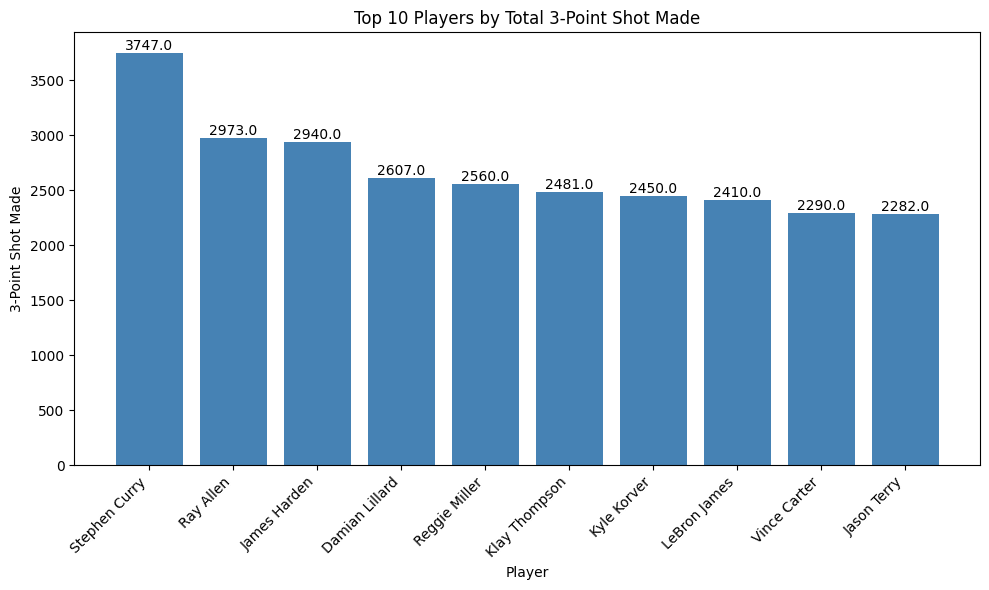

In [15]:
# คำนวณผลรวมการยิง 3 คะแนนที่ทำได้ของแต่ละผู้เล่น
top_10_players = df_playertotal.groupby('player')['x3p'].sum().nlargest(10).reset_index()

# สร้างกราฟแท่งสำหรับผู้เล่น 10 อันดับแรก
plt.figure(figsize=(10, 6))
bars = plt.bar(top_10_players['player'], top_10_players['x3p'], color='steelblue')

# เพิ่มค่าไว้บนแท่งกราฟ
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.1f}', ha='center', va='bottom')

# หมุนชื่อแกน x
plt.xticks(rotation=45, ha='right')

# ตั้งชื่อแกนและชื่อกราฟ
plt.title('Top 10 Players by Total 3-Point Shot Made')
plt.xlabel('Player')
plt.ylabel('3-Point Shot Made')

# แสดงกราฟ
plt.tight_layout()
plt.show()


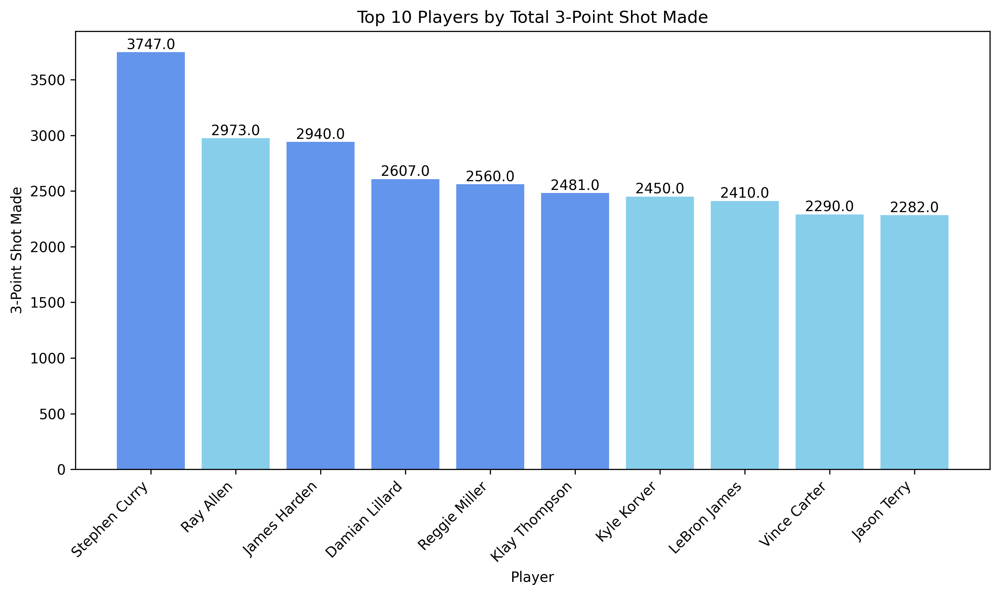

In [16]:
# Create a new column 'Player-Season' by combining player name and season
df_playertotal['Player-Season'] = df_playertotal['player'] + '-' + df_playertotal['season'].astype(str)

# Calculate the total 3-Point shots made (x3p) and 3-Point attempts (x3pa) for each player
player_3p_totals = df_playertotal.groupby('player')['x3p'].sum()
player_3pa_totals = df_playertotal.groupby('player')['x3pa'].sum()

# Calculate the 3-Point shooting percentage (x3p_percent = x3p / x3pa * 100)
player_x3p_percent = (player_3p_totals / player_3pa_totals) * 100

# Create a DataFrame for the top 10 players by total 3-Point shots made
top_10_by_total_x3p_with_experience = pd.DataFrame({
    'player': player_3p_totals.index,
    'x3pa': player_3pa_totals.values,  # Add the 3-point attempts column
    'x3p': player_3p_totals.values,
    'x3p_percent': player_x3p_percent.values
}).sort_values(by='x3p', ascending=False).head(10)

# Calculate the max experience for each player
max_experience = df_playertotal.groupby('player')['experience'].max()

# Add the 'max_experience' column to the DataFrame
top_10_by_total_x3p_with_experience['max_experience'] = top_10_by_total_x3p_with_experience['player'].map(max_experience)

# Reorder the columns to place 'x3p' before 'x3pa'
top_10_by_total_x3p_with_experience_reordered = top_10_by_total_x3p_with_experience[['player', 'x3p', 'x3pa', 'x3p_percent', 'max_experience']]

# Reset the index of the DataFrame
top_10_by_total_x3p_with_experience_reordered_reset = top_10_by_total_x3p_with_experience_reordered.reset_index(drop=True)


# Plot the bar chart for 3-Point shots made (x3p) by the top 10 players
players = top_10_by_total_x3p_with_experience_reordered_reset['player']
x3p_values = top_10_by_total_x3p_with_experience_reordered_reset['x3p']

plt.figure(figsize=(10, 6), dpi=300)

# Color only bars at positions 1, 3, 4, 5, and 6 differently
colors = ['cornflowerblue' if i in [0, 2, 3, 4, 5] else 'skyblue' for i in range(len(players))]

# Create bar chart with custom colors
bars = plt.bar(players, x3p_values, color=colors)

# Add labels and title
plt.xlabel('Player')
plt.ylabel('3-Point Shot Made')
plt.title('Top 10 Players by Total 3-Point Shot Made')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Add numbers on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 1), ha='center', va='bottom')

# Display the chart
plt.tight_layout()
plt.show()


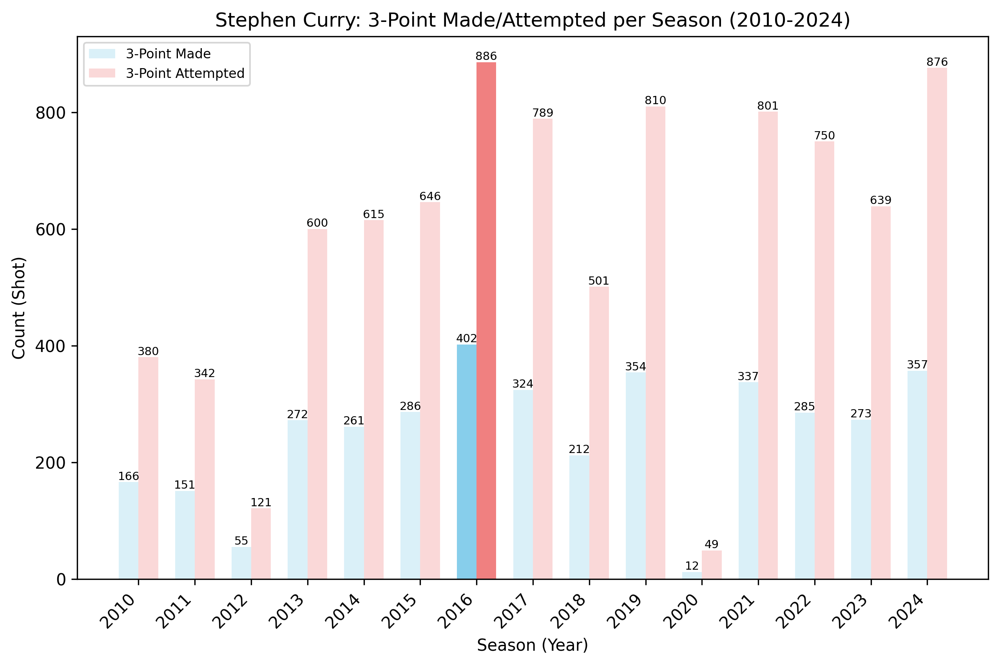

In [17]:
# Filter data for Stephen Curry and seasons since 2010
stephen_curry_data = df_playertotal[
    (df_playertotal['player'] == 'Stephen Curry') & (df_playertotal['season'] >= 2010)
]

# Group data by season and calculate total x3p and x3pa
grouped_data = stephen_curry_data.groupby('season')[['x3p', 'x3pa']].sum()

# Get seasons and x3p/x3pa values
seasons = grouped_data.index
x3p_values = grouped_data['x3p']
x3pa_values = grouped_data['x3pa']

# Set bar width
bar_width = 0.35

# Create the bar chart
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)

# Plot x3p bars with opacity
x3p_bars = ax.bar(
    seasons, x3p_values, bar_width, label='3-Point Made', color='skyblue', alpha=0.3
)
x3p_bars[seasons.get_loc(2016)].set_alpha(1)  # Set opacity for 2016 to 1

# Plot x3pa bars with opacity
x3pa_bars = ax.bar(
    seasons + bar_width,
    x3pa_values,
    bar_width,
    label='3-Point Attempted',
    color='lightcoral',
    alpha=0.3,
)
x3pa_bars[seasons.get_loc(2016)].set_alpha(1)  # Set opacity for 2016 to 1

# Add values on top of bars
for bar in x3p_bars + x3pa_bars:
    height = bar.get_height()
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        height,
        int(height),
        ha='center',
        va='bottom',
        fontsize=7,
    )

# Customize the plot
ax.set_xlabel('Season (Year)')
ax.set_ylabel('Count (Shot)')
ax.set_title('Stephen Curry: 3-Point Made/Attempted per Season (2010-2024)')
ax.set_xticks(seasons + bar_width / 2)
ax.set_xticklabels(seasons, rotation=45, ha='right')
ax.legend(fontsize=8)

# Show the plot
plt.show()

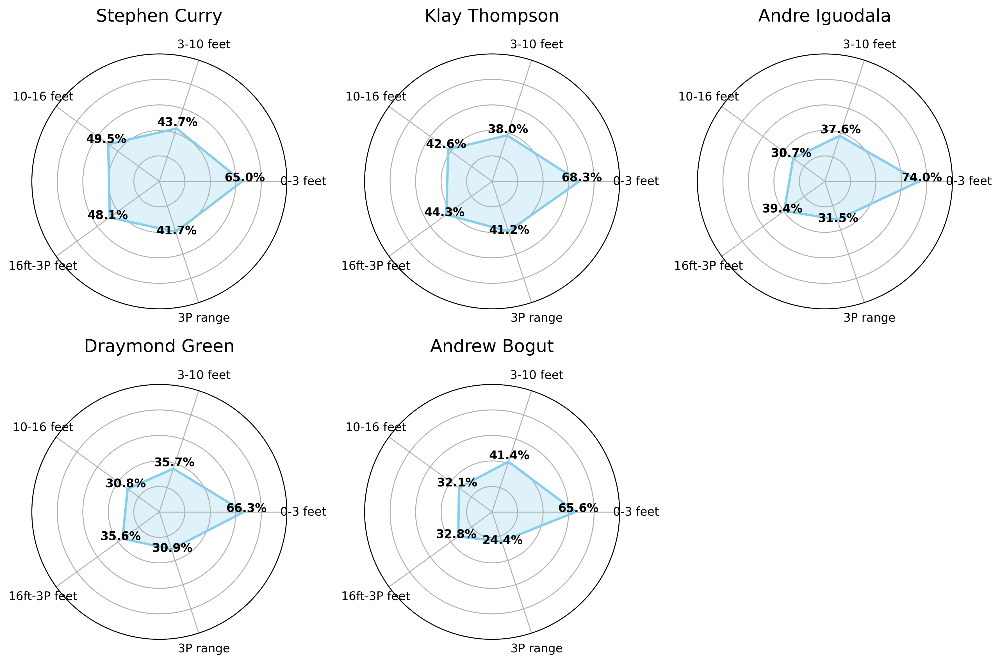

In [37]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from math import pi

# Define the shooting zones and corresponding display names
shooting_zones_columns = [
    'fg_percent_from_x0_3_range',
    'fg_percent_from_x3_10_range',
    'fg_percent_from_x10_16_range',
    'fg_percent_from_x16_3p_range',
    'fg_percent_from_x3p_range'
]

categories_display = [
    '0-3 feet',
    '3-10 feet',
    '10-16 feet',
    '16ft-3P feet',
    '3P range'
]

# Function to create radar charts with a 2x3 layout
def plot_radar_with_original_layout(player_ids, data):
    # Set dpi in plt.figure instead of figsize to affect resolution correctly
    fig, axes = plt.subplots(2, 3, figsize=(12, 8), subplot_kw=dict(polar=True), dpi=300)
    axes = axes.flatten()

    for i, player_id in enumerate(player_ids):
        # ตรวจสอบว่าคอลัมน์ 'player_id' มีอยู่ใน data
        if 'player_id' not in data.columns:
            print(f"Column 'player_id' does not exist in the data")
            return

        # เลือกข้อมูลผู้เล่นโดยใช้ player_id
        player_data = data[data['player_id'] == player_id]

        if player_data.empty:
            print(f"No data found for player_id: {player_id}")
            continue

        # ตรวจสอบว่าคอลัมน์เปอร์เซ็นต์การยิงทั้งหมดมีอยู่ใน DataFrame
        if not all(col in data.columns for col in shooting_zones_columns):
            print(f"Some of the required columns for shooting zones are missing in the data.")
            return

        player_name = player_data['player'].values[0]
        player_mean_values = player_data[shooting_zones_columns].mean().values * 100
        player_mean_values = np.concatenate((player_mean_values, [player_mean_values[0]]))

        categories = categories_display
        n = len(categories)
        angles = [i / float(n) * 2 * pi for i in range(n)]
        angles += angles[:1]

        ax = axes[i]
        ax.fill(angles, player_mean_values, color='skyblue', alpha=0.25)
        ax.plot(angles, player_mean_values, color='skyblue', linewidth=2, label=f'{player_name}')
        ax.set_title(player_name, size=15, y=1.1)
        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(categories, fontsize=10)

        # Set the radial limits to range from 0% to 100%
        ax.set_ylim(0, 100)

        # Remove radial tick labels (20, 40, 60, 80, 100)
        ax.set_yticklabels([])

        # Display values on the radar chart
        for j, angle in enumerate(angles[:-1]):
            ax.text(angle, player_mean_values[j] + 2, f'{player_mean_values[j]:.1f}%',
                    horizontalalignment='center', size=10, color='black', weight='bold')

    # Remove unused axes if there are less than 6 players
    if len(player_ids) < len(axes):
        for j in range(len(player_ids), len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Example usage with player IDs
player_ids = [int(3903), int(4036), int(3500), int(4085), int(3573)]  # Replace with your desired player IDs

# ตรวจสอบให้แน่ใจว่า DataFrame df_playershoot ถูกต้องตามที่ต้องการ
plot_radar_with_original_layout(player_ids, df_playershoot)

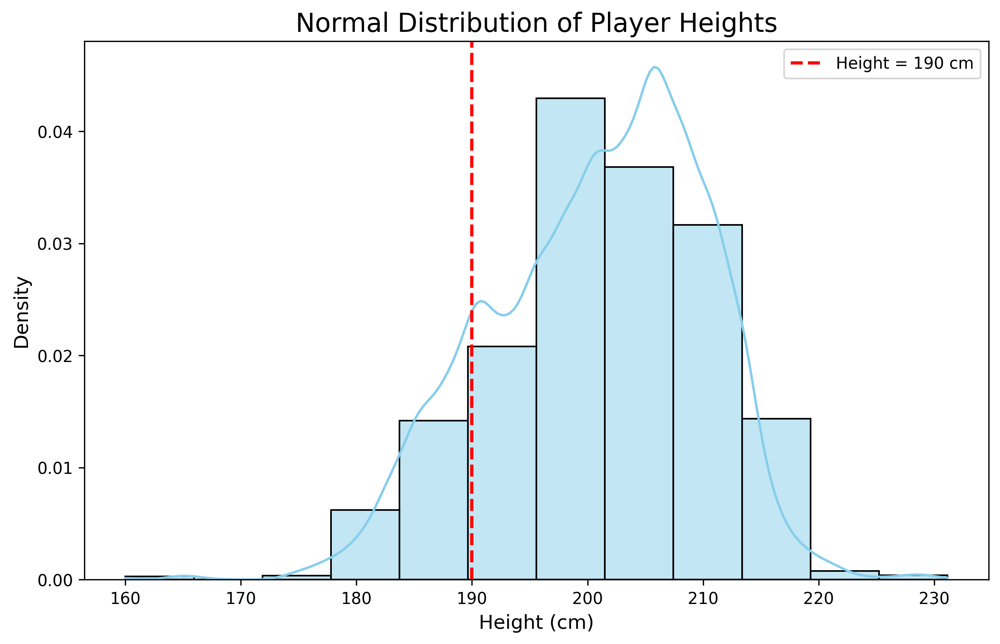

In [38]:
# Use the correct DataFrame, df_weightandheight, instead of redefining df_weightandheighta
df_weightandheighta = df_weightandheight

# Extract the "player_height" column, ensuring there are no missing values
player_height = df_weightandheighta['player_height'].dropna()

# Plot the normal distribution of the player height
plt.figure(figsize=(10, 6), dpi=300)
sns.histplot(player_height, kde=True, bins=12, stat='density', color='skyblue')

# Add a vertical line at 190 cm to highlight that specific height
plt.axvline(x=190, color='red', linestyle='--', linewidth=2, label='Height = 190 cm')

# Add labels and title
plt.title('Normal Distribution of Player Heights', fontsize=16)
plt.xlabel('Height (cm)', fontsize=12)
plt.ylabel('Density', fontsize=12)

# Add legend to explain the vertical line
plt.legend()

# Display the plot
plt.show()


## Part 2: Trend of 3 Points

In [18]:
df_3pa_trend = df_playertotal.loc[:, ['season','x3pa', 'x3p', 'x2pa', 'x2p','orb', 'drb' , 'trb', 'ft', 'fta','fg', 'fga','pts' ]]
df_groupby_year = df_3pa_trend.groupby(['season'])[['x3pa','x3p', 'x2pa', 'x2p','orb', 'drb' , 'trb', 'ft', 'fta','fg','fga','pts']].agg('sum')
df_groupby_year['3pts'] = (df_groupby_year['x3p']*3) #Get 3 Score
df_groupby_year['2pts'] = (df_groupby_year['x2p']*2) #Get 2 Score
df_groupby_year['3pts%'] = ((df_groupby_year['3pts'] / df_groupby_year['pts'])*100).apply(lambda x: round(x,2))
df_groupby_year['2pts%'] = ((df_groupby_year['2pts'] / df_groupby_year['pts'])*100).apply(lambda x: round(x,2))
df_groupby_year['ft%'] = ((df_groupby_year['ft'] / df_groupby_year['pts'])*100).apply(lambda x: round(x,2))
df_groupby_year['x3p_percent'] = ((df_groupby_year['x3p'] / df_groupby_year['x3pa'])*100).apply(lambda x: round(x,2))
df_groupby_year['x2p_percent'] = ((df_groupby_year['x2p'] / df_groupby_year['x2pa'])*100).apply(lambda x: round(x,2))
df_groupby_year['ft_percent'] = ((df_groupby_year['ft'] / df_groupby_year['fta'])*100).apply(lambda x: round(x,2))
df_groupby_year.style.format("{:,}".format, subset=df_groupby_year.select_dtypes(include=['number']).columns)

,x3pa,x3p,x2pa,x2p,orb,drb,trb,ft,fta,fg,fga,pts,3pts,2pts,3pts%,2pts%,ft%,x3p_percent,x2p_percent,ft_percent
season,,,,,,,,,,,,,,,,,,,,
1980,"5,003.0","1,403.0","158,518","77,332","27,165.0","53,900.0","81,065.0","38,366","50,212","78,735","163,521","197,239","4,209.0","154,664",2.13,78.41,19.45,28.04,48.78,76.41
1981,"3,815.0",936.0,"162,954","80,089","27,437.0","54,573.0","82,010.0","40,900","54,481","81,025","166,769","203,886","2,808.0","160,178",1.38,78.56,20.06,24.53,49.15,75.07
1982,"4,308.0","1,129.0","162,110","80,603","27,039.0","54,948.0","81,987.0","40,183","53,889","81,732","166,418","204,776","3,387.0","161,206",1.65,78.72,19.62,26.21,49.72,74.57
1983,"4,248.0","1,011.0","164,850","81,076","27,970.0","55,883.0","83,853.0","39,473","53,336","82,087","169,098","204,658","3,033.0","162,152",1.48,79.23,19.29,23.8,49.18,74.01
1984,"4,484.0","1,120.0","162,154","80,887","26,772.0","54,378.0","81,150.0","42,534","55,992","82,007","166,638","207,668","3,360.0","161,774",1.62,77.9,20.48,24.98,49.88,75.96
1985,"5,917.0","1,671.0","162,131","80,861","26,999.0","55,009.0","82,008.0","42,306","55,381","82,532","168,048","209,041","5,013.0","161,722",2.4,77.36,20.24,28.24,49.87,76.39
1986,"6,293.0","1,774.0","160,873","79,691","26,661.0","55,500.0","82,161.0","43,171","57,079","81,465","167,166","207,875","5,322.0","159,382",2.56,76.67,20.77,28.19,49.54,75.63
1987,"8,913.0","2,687.0","158,542","77,735","27,725.0","55,295.0","83,020.0","43,807","57,449","80,422","167,455","207,338","8,061.0","155,470",3.89,74.98,21.13,30.15,49.03,76.25
1988,"9,421.0","2,979.0","156,020","76,494","26,834.0","54,994.0","81,828.0","42,068","54,933","79,473","165,441","203,993","8,937.0","152,988",4.38,75.0,20.62,31.62,49.03,76.58


In [19]:
x = np.arange(df_groupby_year.index.size) # Use .index to access the index of the DataFrame
fit = np.polyfit(x, df_groupby_year['x3pa'], deg=1)
#print ("Slope : " + str(fit[0]))
#print ("Intercept : " + str(fit[1]))

<ipython-input-39-a530ab98f125>:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  rank_1_teams['x3p_percent'].fillna(0, inplace=True)


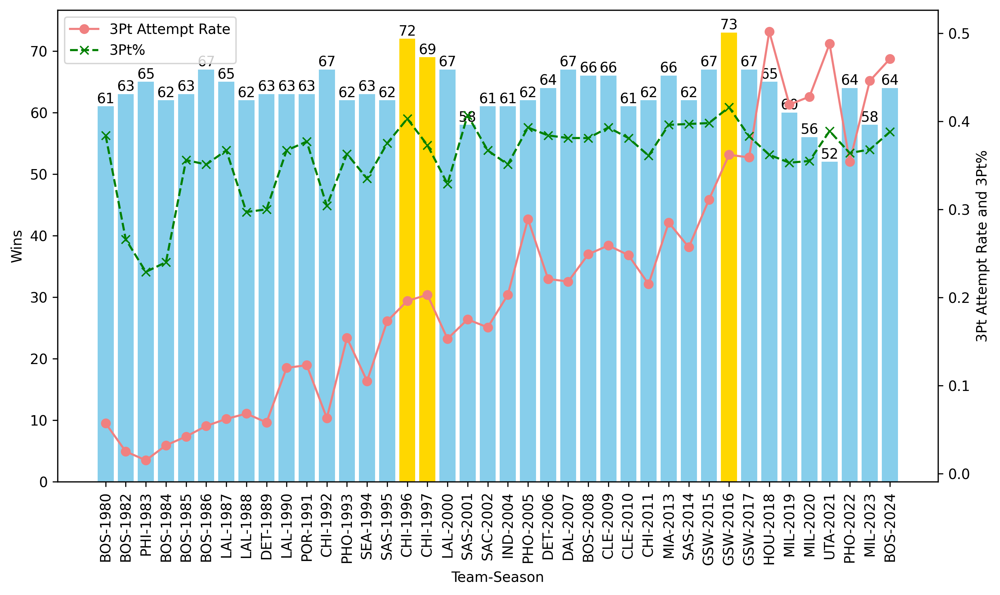

In [39]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming team_summaries_df and team_totals_df are your DataFrames

# สร้างคอลัมน์ 'rank' โดยการจัดอันดับทีมตามจำนวนชนะ 'w' (จากมากไปน้อย)
df_teamsummary['rank'] = df_teamsummary.groupby('season')['w'].rank(ascending=False)

# กรองทีมที่มีอันดับ 1 ของแต่ละฤดูกาล
rank_1_teams = df_teamsummary[df_teamsummary['rank'] == 1].copy()

# สร้างคอลัมน์ 'Team-Season' และจัดเรียงข้อมูลตามฤดูกาล (season)
rank_1_teams['Team-Season'] = rank_1_teams['abbreviation'] + "-" + rank_1_teams['season'].astype(str)
rank_1_teams = rank_1_teams.sort_values('season')

# Merge team_summaries_df with team_totals_df โดยใช้ 'abbreviation' และ 'season' เป็นตัวเชื่อม
rank_1_teams = pd.merge(rank_1_teams, df_teamtotal[['abbreviation', 'season', 'x3p_percent']],
                        on=['abbreviation', 'season'], how='left')

# เติมค่า NA ในคอลัมน์ x3p_percent ด้วยค่า 0
rank_1_teams['x3p_percent'].fillna(0, inplace=True)

# ระบุทีมที่อยู่ใน 3 อันดับแรกจากการเรียงลำดับจำนวนชัยชนะ (w)
top_3_teams = rank_1_teams.nlargest(3, 'w')

# กำหนดสีให้กับทีมใน 3 อันดับแรกและทีมที่เหลือ
bar_colors = ['gold' if team in top_3_teams['Team-Season'].values else 'skyblue' for team in rank_1_teams['Team-Season']]

# สร้างกราฟ
fig, ax1 = plt.subplots(figsize=(10, 6), dpi=300)

# กราฟแท่งแสดงจำนวนชัยชนะ (w) พร้อมสีพิเศษสำหรับทีมที่อยู่ใน 3 อันดับแรก
ax1.bar(rank_1_teams['Team-Season'], rank_1_teams['w'], color=bar_colors)
ax1.set_xlabel('Team-Season')
ax1.set_ylabel('Wins', color='black')
ax1.tick_params(axis='y', labelcolor='black')
plt.xticks(rotation=90)

# เพิ่มข้อความบนแท่งกราฟ
for p in ax1.patches:
    ax1.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='bottom', color='black')

# กราฟเส้นแสดง 'x3p_ar' และ 'x3p_percent'
ax2 = ax1.twinx()
ax2.plot(rank_1_teams['Team-Season'], rank_1_teams['x3p_ar'], color='lightcoral', marker='o', label='3Pt Attempt Rate')
ax2.plot(rank_1_teams['Team-Season'], rank_1_teams['x3p_percent'], color='green', marker='x', linestyle='--', label='3Pt%')
ax2.set_ylabel('3Pt Attempt Rate and 3Pt%')
ax2.tick_params(axis='y', labelcolor='black')

plt.legend(loc='upper left')
plt.tight_layout()
plt.show()

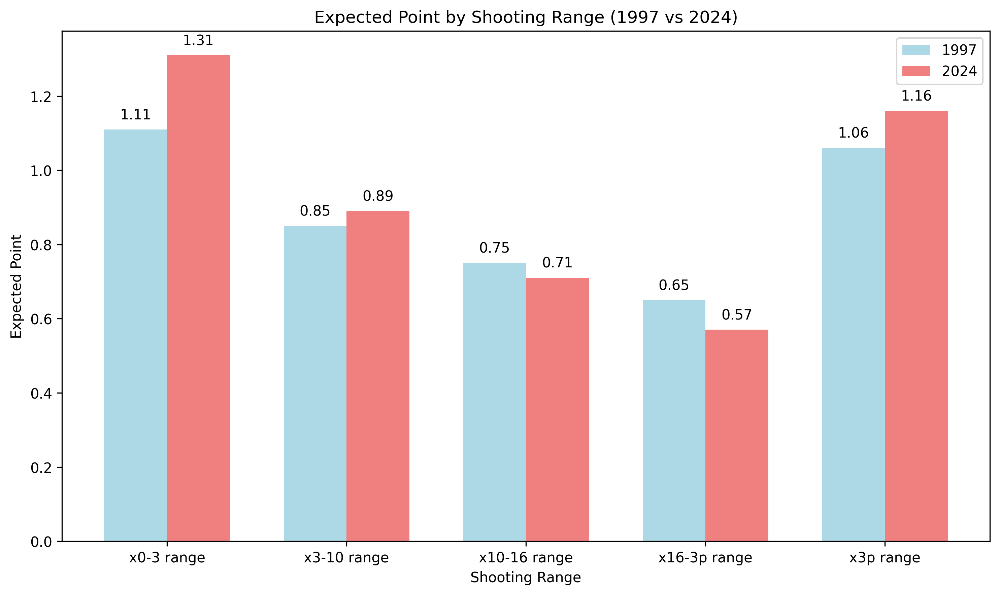

In [40]:
# Create a mock version of 'shooting_data' for demonstration
data = {
    'season': [1997, 1997, 2024, 2024],
    'fg_percent_from_x0_3_range': [0.55, 0.56, 0.65, 0.66],
    'fg_percent_from_x3_10_range': [0.42, 0.43, 0.44, 0.45],
    'fg_percent_from_x10_16_range': [0.37, 0.38, 0.35, 0.36],
    'fg_percent_from_x16_3p_range': [0.32, 0.33, 0.28, 0.29],
    'fg_percent_from_x3p_range': [0.35, 0.36, 0.38, 0.39]
}

# Creating a DataFrame that mimics the shooting_data
shooting_data = pd.DataFrame(data)

# Define the point multipliers for the expected points calculation
point_multipliers = {
    'x0_3_range': 2,
    'x3_10_range': 2,
    'x10_16_range': 2,
    'x16_3p_range': 2,
    'x3p_range': 3
}

# Filter the data for the 1997 and 2024 seasons
df_1997_2024 = shooting_data[(shooting_data['season'].isin([1997, 2024]))][[
    'season',
    'fg_percent_from_x0_3_range',
    'fg_percent_from_x3_10_range',
    'fg_percent_from_x10_16_range',
    'fg_percent_from_x16_3p_range',
    'fg_percent_from_x3p_range'
]]

# List of shooting ranges
ranges = ['x0_3_range', 'x3_10_range', 'x10_16_range', 'x16_3p_range', 'x3p_range']

# Function to calculate expected points
def calculate_expected_points(df, ranges, point_multipliers):
    for r in ranges:
        df[f'expected_points_{r}'] = df[f'fg_percent_from_{r}'] * point_multipliers[r]
    return df

# Calculate the average expected points for 1997 and 2024 seasons
season_avg = calculate_expected_points(df_1997_2024.groupby('season').mean().reset_index(), ranges, point_multipliers)

# Create the DataFrame that will be used for the bar chart
expected_points_pandas = pd.DataFrame({
    'Expected Points': ['x0-3 range', 'x3-10 range', 'x10-16 range', 'x16-3p range', 'x3p range'],
    '1997': season_avg[season_avg['season'] == 1997][[f'expected_points_{r}' for r in ranges]].values.flatten().round(2),
    '2024': season_avg[season_avg['season'] == 2024][[f'expected_points_{r}' for r in ranges]].values.flatten().round(2)
})

# Data for plotting
categories = expected_points_pandas['Expected Points']
values_1997 = expected_points_pandas['1997']
values_2024 = expected_points_pandas['2024']

# Bar chart settings
bar_width = 0.35
index = range(len(categories))

# Create a figure
fig, ax = plt.subplots(figsize=(10, 6),dpi = 300)

# Create bars for 1997 and 2024
bars_1997 = ax.bar(index, values_1997, bar_width, label='1997', color='lightblue')
bars_2024 = ax.bar([i + bar_width for i in index], values_2024, bar_width, label='2024', color='lightcoral')

# Adding the labels
ax.set_xlabel('Shooting Range')
ax.set_ylabel('Expected Point')
ax.set_title('Expected Point by Shooting Range (1997 vs 2024)')
ax.set_xticks([i + bar_width / 2 for i in index])
ax.set_xticklabels(categories)

# Adding the numbers on top of each bar
for i, v in enumerate(values_1997):
    ax.text(i, v + 0.02, str(v), ha='center', va='bottom')
for i, v in enumerate(values_2024):
    ax.text(i + bar_width, v + 0.02, str(v), ha='center', va='bottom')

# Adding the legend
ax.legend()

# Display the chart
plt.tight_layout()
plt.show()


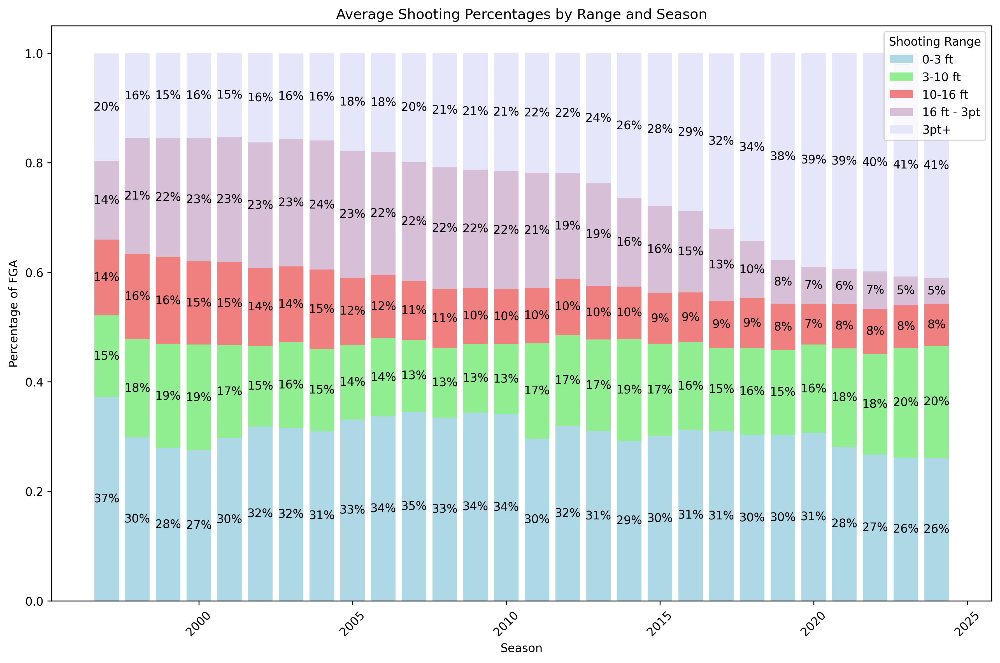

In [41]:
# Assuming 'data_cleaned' is your DataFrame
df_playershoot['season'] = df_playershoot['season'].astype(int)

# Aggregating the average of percentage of FGA from different ranges per season
stacked_data = df_playershoot.groupby('season').agg({
    'percent_fga_from_x0_3_range': 'mean',
    'percent_fga_from_x3_10_range': 'mean',
    'percent_fga_from_x10_16_range': 'mean',
    'percent_fga_from_x16_3p_range': 'mean',
    'percent_fga_from_x3p_range': 'mean'
}).reset_index()

# Plotting stacked bar chart
fig, ax = plt.subplots(figsize=(12, 8),dpi = 300)

# Define bar width
bar_width = 0.8

# Plot stacked bar with specific colors for each range
ax.bar(stacked_data['season'], stacked_data['percent_fga_from_x0_3_range'],
       label='0-3 ft', width=bar_width, color='lightblue')
for i, v in enumerate(stacked_data['percent_fga_from_x0_3_range']):
    ax.text(stacked_data['season'][i], v / 2, f'{v:.0%}', ha='center', va='center')

ax.bar(stacked_data['season'], stacked_data['percent_fga_from_x3_10_range'],
       bottom=stacked_data['percent_fga_from_x0_3_range'], label='3-10 ft', width=bar_width, color='lightgreen')
for i, v in enumerate(stacked_data['percent_fga_from_x3_10_range']):
    ax.text(stacked_data['season'][i], stacked_data['percent_fga_from_x0_3_range'][i] + v / 2, f'{v:.0%}', ha='center', va='center')

ax.bar(stacked_data['season'], stacked_data['percent_fga_from_x10_16_range'],
       bottom=stacked_data['percent_fga_from_x0_3_range'] + stacked_data['percent_fga_from_x3_10_range'],
       label='10-16 ft', width=bar_width, color='lightcoral')
for i, v in enumerate(stacked_data['percent_fga_from_x10_16_range']):
    ax.text(stacked_data['season'][i], stacked_data['percent_fga_from_x0_3_range'][i] + stacked_data['percent_fga_from_x3_10_range'][i] + v / 2, f'{v:.0%}', ha='center', va='center')

ax.bar(stacked_data['season'], stacked_data['percent_fga_from_x16_3p_range'],
       bottom=stacked_data['percent_fga_from_x0_3_range'] + stacked_data['percent_fga_from_x3_10_range'] + stacked_data['percent_fga_from_x10_16_range'],
       label='16 ft - 3pt', width=bar_width, color='thistle')
for i, v in enumerate(stacked_data['percent_fga_from_x16_3p_range']):
    ax.text(stacked_data['season'][i], stacked_data['percent_fga_from_x0_3_range'][i] + stacked_data['percent_fga_from_x3_10_range'][i] + stacked_data['percent_fga_from_x10_16_range'][i] + v / 2, f'{v:.0%}', ha='center', va='center')

ax.bar(stacked_data['season'], stacked_data['percent_fga_from_x3p_range'],
       bottom=stacked_data['percent_fga_from_x0_3_range'] + stacked_data['percent_fga_from_x3_10_range'] + stacked_data['percent_fga_from_x10_16_range'] + stacked_data['percent_fga_from_x16_3p_range'],
       label='3pt+', width=bar_width, color='lavender')
for i, v in enumerate(stacked_data['percent_fga_from_x3p_range']):
    ax.text(stacked_data['season'][i], stacked_data['percent_fga_from_x0_3_range'][i] + stacked_data['percent_fga_from_x3_10_range'][i] + stacked_data['percent_fga_from_x10_16_range'][i] + stacked_data['percent_fga_from_x16_3p_range'][i] + v / 2, f'{v:.0%}', ha='center', va='center')


# Customizing chart
ax.set_title('Average Shooting Percentages by Range and Season')
ax.set_xlabel('Season')
ax.set_ylabel('Percentage of FGA')

# Display the legend
ax.legend(title="Shooting Range")

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

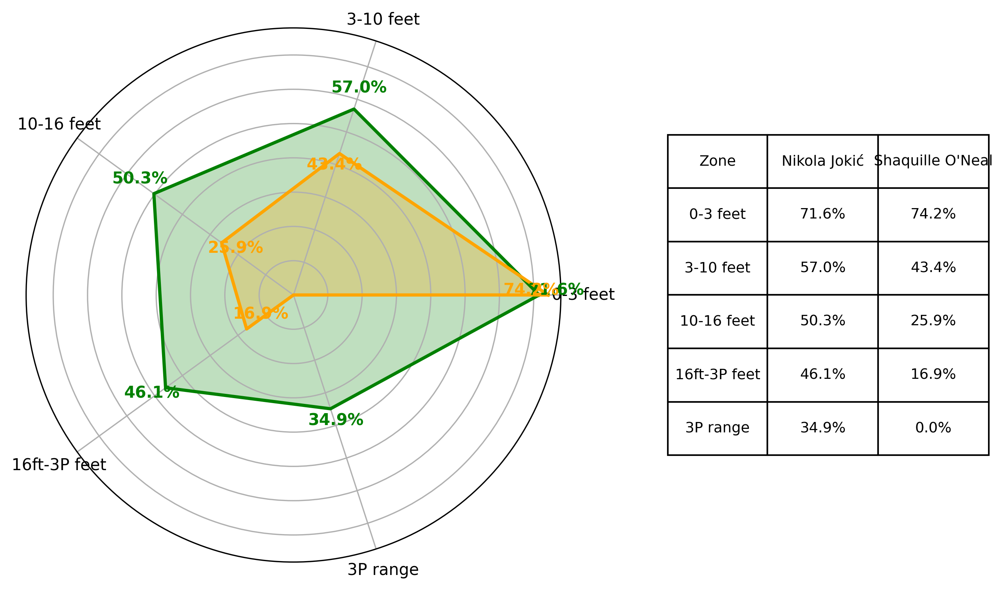

In [42]:
# กำหนดคอลัมน์ที่สนใจ (โซนการยิง)
shooting_zones_columns = [
    'fg_percent_from_x0_3_range',
    'fg_percent_from_x3_10_range',
    'fg_percent_from_x10_16_range',
    'fg_percent_from_x16_3p_range',
    'fg_percent_from_x3p_range'
]

# ชื่อที่ต้องการแสดงในกราฟแทนที่ชื่อคอลัมน์
categories_display = [
    '0-3 feet',
    '3-10 feet',
    '10-16 feet',
    '16ft-3P feet',
    '3P range'
]

# ฟังก์ชันสำหรับวาดกราฟเรดาร์พร้อม legend แบบตาราง
def plot_radar_chart_with_table(player_id1, player_id2, data):
    # ดึงข้อมูลของผู้เล่นจาก player_id
    player_data1 = df_playershoot[df_playershoot['player_id'] == player_id1]
    player_data2 = df_playershoot[df_playershoot['player_id'] == player_id2]

    # ดึงชื่อผู้เล่นจากคอลัมน์ "player"
    player_name1 = player_data1['player'].values[0]
    player_name2 = player_data2['player'].values[0]

    if player_data1.empty:
        print(f"No data found for player_id: {player_id1}")
        return

    if player_data2.empty:
        print(f"No data found for player_id: {player_id2}")
        return

    # คำนวณเปอร์เซ็นต์ของผู้เล่นแต่ละคนในแต่ละโซน
    player_mean_values1 = player_data1[shooting_zones_columns].mean().values * 100
    player_mean_values2 = player_data2[shooting_zones_columns].mean().values * 100

    # เพิ่มข้อมูลกลับไปที่จุดแรกเพื่อปิดกราฟ
    player_mean_values1 = np.concatenate((player_mean_values1, [player_mean_values1[0]]))
    player_mean_values2 = np.concatenate((player_mean_values2, [player_mean_values2[0]]))

    # ชื่อของแต่ละโซนที่จะแสดงในกราฟ
    categories = categories_display
    n = len(categories)

    # คำนวณมุมของแต่ละแกน
    angles = [i / float(n) * 2 * pi for i in range(n)]
    angles += angles[:1]

    # สร้างกราฟเรดาร์
    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw=dict(polar=True),dpi = 300)

    # วาดกราฟสำหรับผู้เล่น 1
    ax.fill(angles, player_mean_values1, color='green', alpha=0.25)
    ax.plot(angles, player_mean_values1, color='green', linewidth=2, label=f'{player_name1}')

    # วาดกราฟสำหรับผู้เล่น 2
    ax.fill(angles, player_mean_values2, color='orange', alpha=0.25)
    ax.plot(angles, player_mean_values2, color='orange', linewidth=2, label=f'{player_name2}')

    # กำหนดค่าต่าง ๆ บนแกน
    plt.xticks(angles[:-1], categories, fontsize=10)

    # เอาเลขบนวงแกนออก
    ax.set_yticklabels([])

    # แสดงค่า % ของผู้เล่นแต่ละโซนในกราฟสำหรับผู้เล่น 1
    for i, (angle, value) in enumerate(zip(angles[:-1], player_mean_values1[:-1])):
        ax.text(angle, value + 5, f'{value:.1f}%', horizontalalignment='center', size=10, color='green', weight='semibold')

    # แสดงค่า % ของผู้เล่นแต่ละโซนในกราฟสำหรับผู้เล่น 2
    for i, (angle, value) in enumerate(zip(angles[:-1], player_mean_values2[:-1])):
        ax.text(angle, value - 5, f'{value:.1f}%', horizontalalignment='center', size=10, color='orange', weight='semibold')

    # สร้างข้อมูลสำหรับตาราง
    table_data = {
        'Zone': categories_display,
        player_name1: [f'{v:.1f}%' for v in player_mean_values1[:-1]],  # ไม่รวมค่าซ้ำ
        player_name2: [f'{v:.1f}%' for v in player_mean_values2[:-1]]
    }
    df = pd.DataFrame(table_data)

    # เพิ่มตารางเป็น legend ข้างนอกกราฟ radar
    table = plt.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='right', bbox=[1.2, 0.2, 0.6, 0.6])
    table.auto_set_font_size(False)
    table.set_fontsize(9)

    # ขยายขนาดคอลัมน์ Zone โดยการเข้าถึงเซลล์ในตาราง
    for key, cell in table.get_celld().items():
        if key[1] == 0:  # คอลัมน์ "Zone"
            cell.set_width(0.3)  # ขยายขนาดคอลัมน์ Zone

    # แสดงกราฟ
    plt.show()

# ป้อน player_id ที่ต้องการเปรียบเทียบ
player_id1 = int(4352)  # เปลี่ยนตามต้องการ
player_id2 = int(2751)  # เปลี่ยนตามต้องการ

# เรียกฟังก์ชันวาดกราฟพร้อมตาราง
plot_radar_chart_with_table(player_id1, player_id2, df_playershoot)

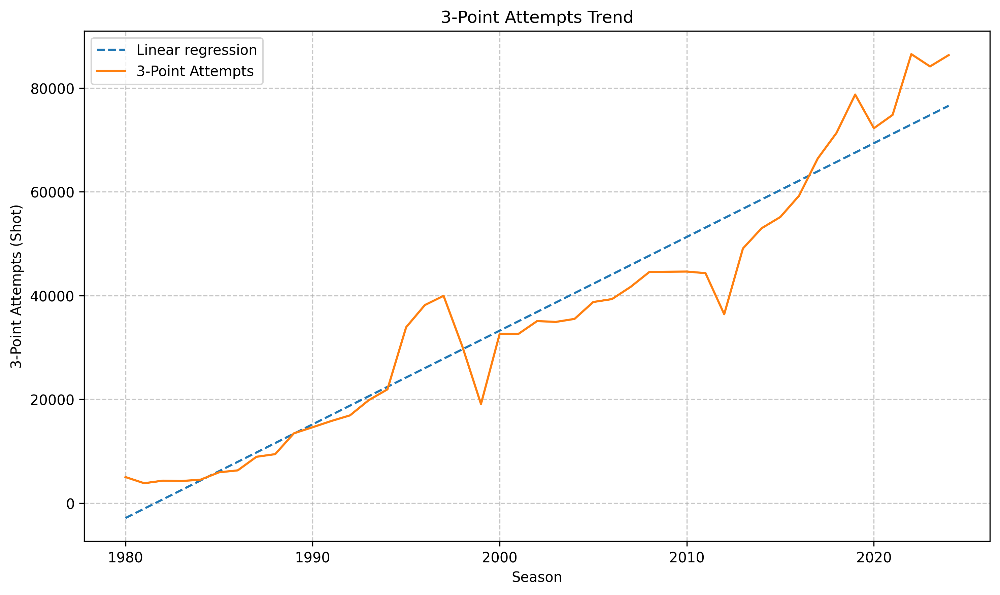

In [20]:
fit_function = np.poly1d(fit)
plt.figure(figsize=(10, 6), dpi=300)
#Linear regression plot
plt.plot(df_groupby_year.index, fit_function(x), linestyle='--', label='Linear regression')
#Time series data plot
plt.plot(df_groupby_year.index, df_groupby_year['x3pa'], label='3-Point Attempts')
plt.xlabel('Season')
plt.ylabel('3-Point Attempts (Shot)')
plt.title('3-Point Attempts Trend')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

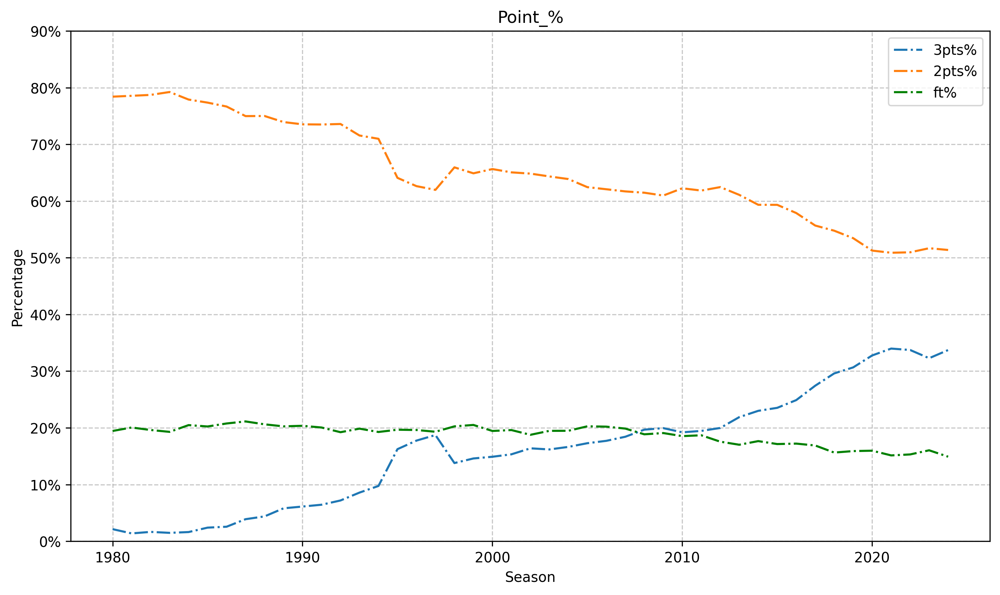

In [21]:
plt.figure(figsize=(10, 6), dpi=300)
plt.gca().yaxis.set_major_formatter(PercentFormatter())
# Set y-axis limits
plt.ylim(0, 90)
plt.plot(df_groupby_year.index, df_groupby_year['3pts%'], label='3pts%', linestyle='-.')
plt.plot(df_groupby_year.index, df_groupby_year['2pts%'], label='2pts%', linestyle='-.')
plt.plot(df_groupby_year.index, df_groupby_year['ft%'], label='ft%', color='g', linestyle='-.')
plt.xlabel('Season')
plt.ylabel('Percentage')
plt.title('Point_%')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

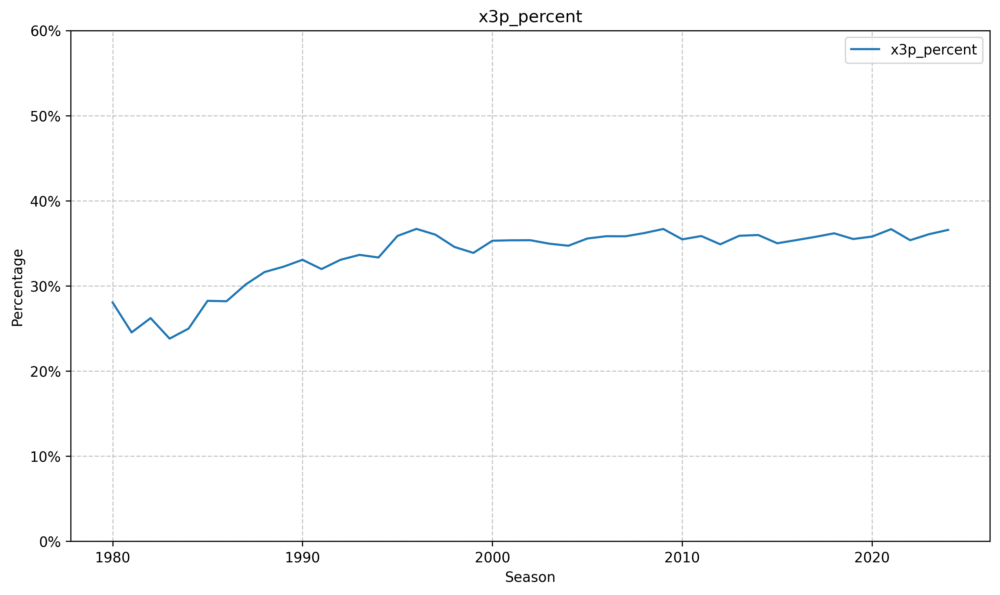

In [22]:
plt.figure(figsize=(10, 6), dpi=300)
plt.gca().yaxis.set_major_formatter(PercentFormatter())
# Set y-axis limits
plt.ylim(0, 60)
plt.plot(df_groupby_year.index, df_groupby_year['x3p_percent'], label='x3p_percent')
plt.xlabel('Season')
plt.ylabel('Percentage')
plt.title('x3p_percent')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

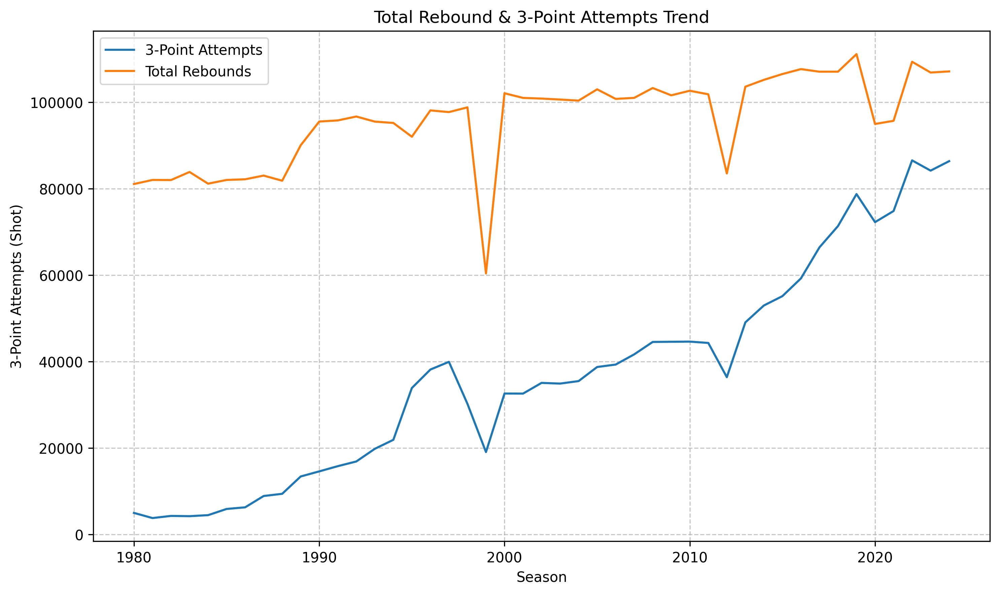

In [23]:
fit_function = np.poly1d(fit)
plt.figure(figsize=(10, 6), dpi=300)
#Time series data plot
plt.plot(df_groupby_year.index, df_groupby_year['x3pa'], label='3-Point Attempts')
plt.plot(df_groupby_year.index, df_groupby_year['trb'] , label ='Total Rebounds')
plt.xlabel('Season')
plt.ylabel('3-Point Attempts (Shot)')
plt.title('Total Rebound & 3-Point Attempts Trend')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [24]:
df_3pa_trb_trend = df_groupby_year[['x3pa', 'orb', 'drb' , 'trb']]
df_3pa_trb_trend.style.format("{:,}".format, subset=df_3pa_trb_trend.select_dtypes(include=['number']).columns)
df_3pa_trb_trend.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45 entries, 1980 to 2024
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x3pa    45 non-null     float64
 1   orb     45 non-null     float64
 2   drb     45 non-null     float64
 3   trb     45 non-null     float64
dtypes: float64(4)
memory usage: 2.8 KB


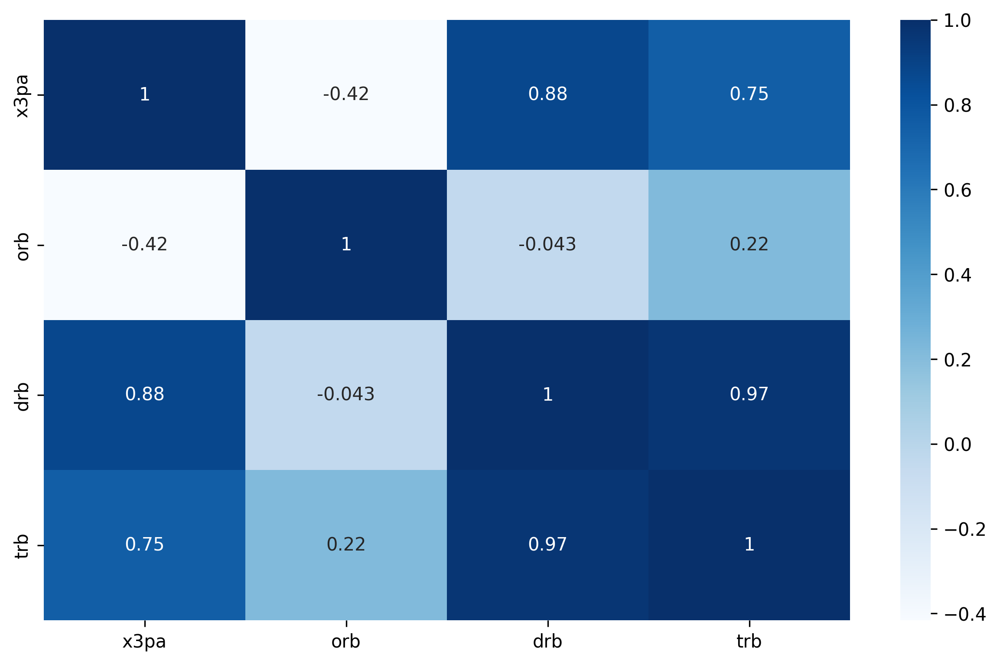

In [25]:
corr = df_3pa_trb_trend.corr()
plt.figure(figsize=(10,6), dpi=300)
sns.heatmap(corr, cmap="Blues",annot=True)
plt.show()

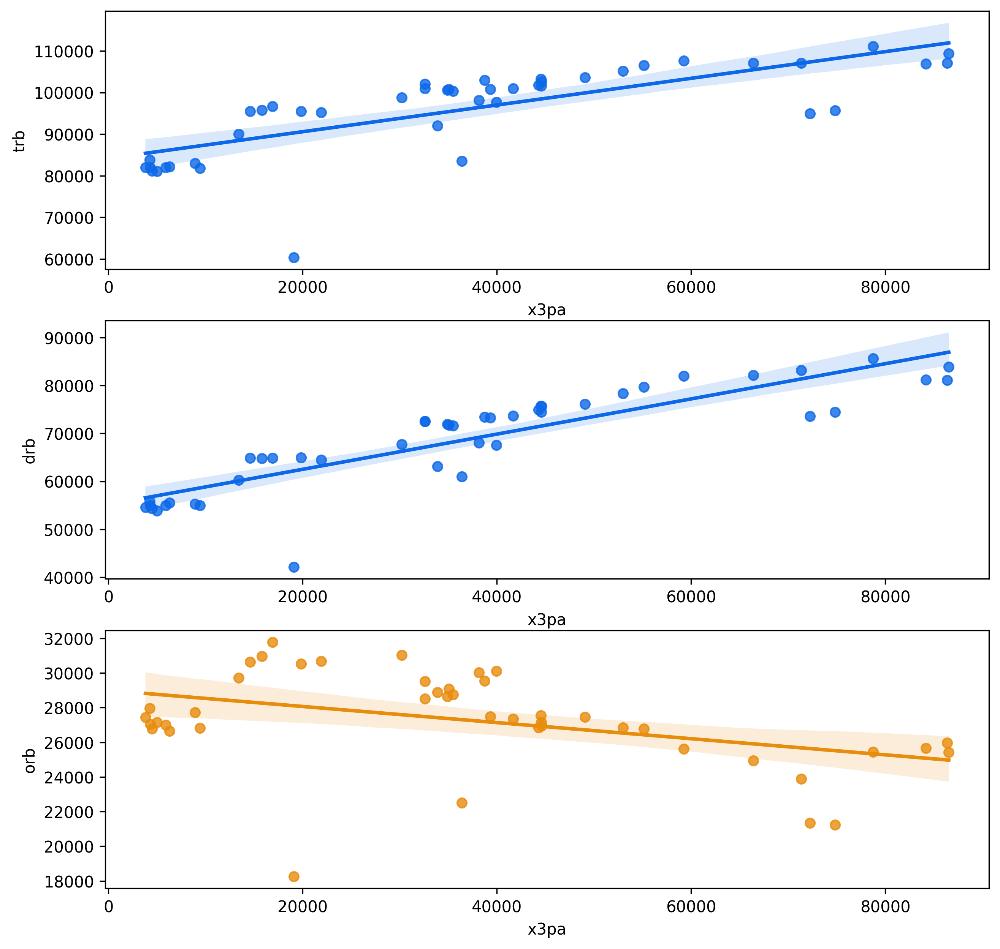

In [26]:
fig, axs = plt.subplots(3,1, figsize=(10,10), dpi=300)

enmax_palette = ["#0c68e8", "#e88c0c"] #Code Hex จาก html color code
sns.set_palette(palette=enmax_palette)

sns.regplot(data=df_groupby_year, x="x3pa", y="trb", ax=axs[0], color="C0") #C0 คือสีแรก
sns.regplot(data=df_groupby_year, x="x3pa", y="drb", ax=axs[1], color="C0")
sns.regplot(data=df_groupby_year, x="x3pa", y="orb", ax=axs[2], color="C1")
plt.show()

In [27]:
df_pos_rb = df_playertotal.loc[ : , ['season','pos','orb', 'drb' , 'trb']]
print(df_pos_rb['pos'].value_counts().reset_index(name='count'))

  pos  count
0  PF   4527
1  SG   4489
2   C   4321
3  PG   4245
4  SF   4133


In [28]:
df_groupby_pos = df_pos_rb.groupby(['pos'])[['orb', 'drb' , 'trb']].agg('sum').sort_values(by=['trb'], ascending=False).reset_index()
df_groupby_pos = df_groupby_pos.iloc[[0,1,2,3,4]]
df_groupby_pos.style.format("{:,}".format, subset=df_groupby_pos.select_dtypes(include=['number']).columns)

,pos,orb,drb,trb
0,C,"389,583.0","836,369.0","1,225,952.0"
1,PF,"360,817.0","827,498.0","1,188,315.0"
2,SF,"223,105.0","570,300.0","793,405.0"
3,SG,"147,296.0","454,500.0","601,796.0"
4,PG,"106,995.0","402,754.0","509,749.0"


In [29]:
df_groupby_pos_melt = pd.melt(df_groupby_pos, id_vars=['pos'], value_vars=['orb', 'drb'])
df_groupby_pos_melt.style.format("{:,}".format, subset=df_groupby_pos_melt.select_dtypes(include=['number']).columns)

,pos,variable,value
0,C,orb,"389,583.0"
1,PF,orb,"360,817.0"
2,SF,orb,"223,105.0"
3,SG,orb,"147,296.0"
4,PG,orb,"106,995.0"
5,C,drb,"836,369.0"
6,PF,drb,"827,498.0"
7,SF,drb,"570,300.0"
8,SG,drb,"454,500.0"
9,PG,drb,"402,754.0"


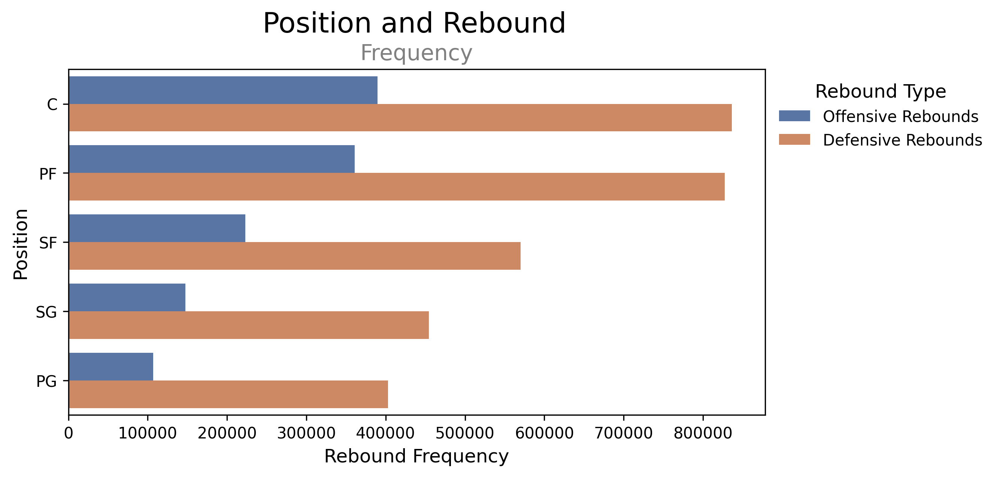

In [30]:
plt.figure(
    figsize=(8, 4),  # Set the figure size here
    dpi=300,  # Set the dpi (or resolution) here
)
sns.barplot(df_groupby_pos_melt, x="value", y="pos", hue="variable", palette="deep")
plt.suptitle(
    "Position and Rebound",  # Main title text
    fontsize=18,  # Set the font size
    color="black",  # Set the color
    x=0.51,  # Adjust this to align with the subtitle
    y=1.01,  # Adjust this to align with the subtitle
)
plt.title(
    "Frequency",  # Subtitle text
    fontsize=14,  # Set the font size
    color="grey",  # Set the color
)
plt.xlabel("Rebound Frequency", fontsize=12)  # Set the x-axis label and fontsize
plt.xticks(fontsize=10)  # Set the font size of the x-axis ticks
plt.ylabel("Position", fontsize=12)  # Set the y-axis label and fontsize
plt.yticks(fontsize=10)  # Set the font size of the y-axis ticks
handles, labels = plt.gca().get_legend_handles_labels()

plt.legend(
    handles=handles,
    title="Rebound Type",  # Set a title for the legend
    title_fontsize=12,  # Set the legend title size
    fontsize=10,  # Set the fontsize of the legend labels
    bbox_to_anchor=(1.28, 0.65),  # Customize the position of the legend here
    frameon=False,  # Disable the legend border
    labels=[  "Offensive Rebounds","Defensive Rebounds"] # Customize the labels you want in the legend
)
sns.move_legend(plt.gca(), "upper left", bbox_to_anchor=(1, 1))
# Show the plot
plt.show()

In [31]:
df_pos_rb = df_pos_rb.loc[ (df_pos_rb['pos'] == 'C') | (df_pos_rb['pos'] == 'PF') | (df_pos_rb['pos'] == 'SF') | (df_pos_rb['pos'] == 'SG') | (df_pos_rb['pos'] == 'PG') , ['season','pos','orb', 'drb' , 'trb']]
df_pos_rb.info()
df_groupby_pos_s = df_pos_rb.groupby(['season','pos'])[['orb', 'drb' , 'trb']].agg('sum').sort_values(by=['season'], ascending=False)
df_groupby_pos_s.style.format("{:,}".format, subset=df_groupby_pos_s.select_dtypes(include=['number']).columns)

<class 'pandas.core.frame.DataFrame'>
Index: 21715 entries, 0 to 23879
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   season  21715 non-null  int64  
 1   pos     21715 non-null  object 
 2   orb     21715 non-null  float64
 3   drb     21715 non-null  float64
 4   trb     21715 non-null  float64
dtypes: float64(3), int64(1), object(1)
memory usage: 1017.9+ KB


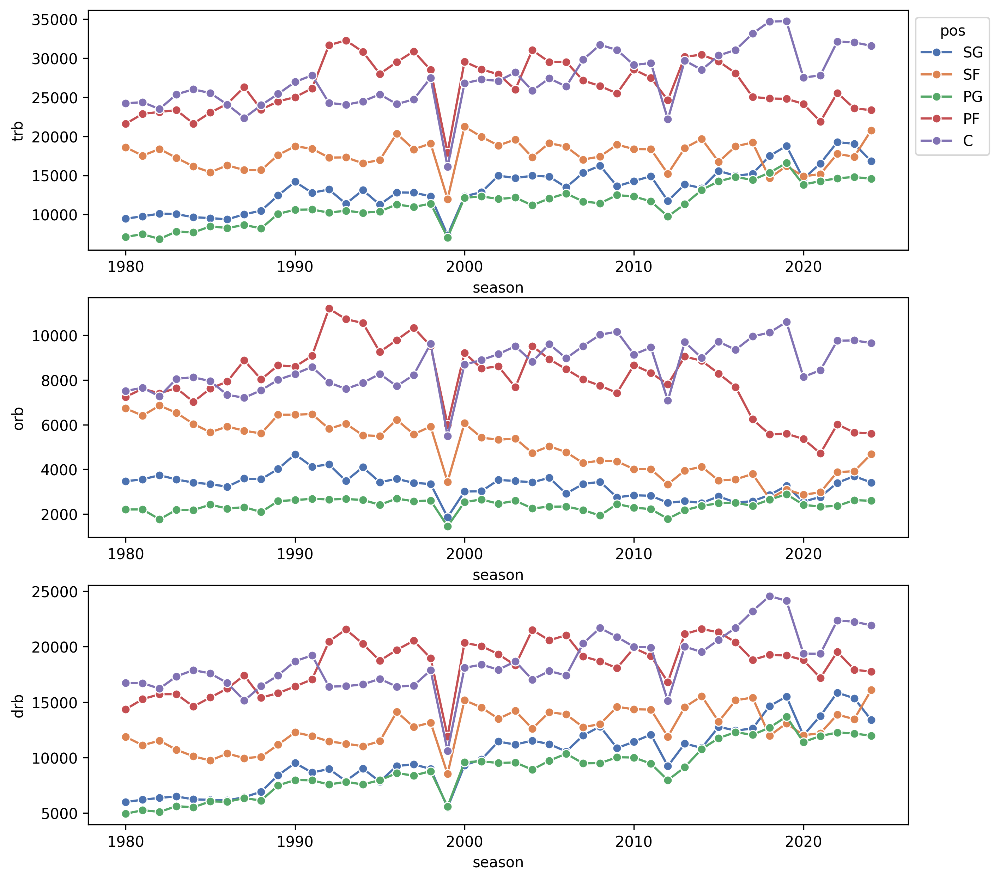

In [32]:
fig, axs = plt.subplots(3,1, figsize=(10,10), dpi=300)

trb_plot = sns.lineplot(data=df_groupby_pos_s, x="season", y="trb" ,hue='pos', palette="deep" ,marker = "o", ax=axs[0])
orb_plot = sns.lineplot(data=df_groupby_pos_s, x="season", y="orb" ,hue='pos', palette="deep" ,marker = "o", ax=axs[1] , legend=False)
drb_plot = sns.lineplot(data=df_groupby_pos_s, x="season", y="drb" ,hue='pos', palette="deep" ,marker = "o", ax=axs[2] , legend=False)

sns.move_legend(trb_plot, "upper left", bbox_to_anchor=(1, 1))

In [33]:
df_player = df_playertotal.loc[ : , ['season','player_id', 'player','pos', 'age','experience', 'g' , 'mp','x3pa', 'x3p'] ]
df_player["id:Player"] = df_player["player_id"].astype(str)+ "_" + df_player["player"]
df_player_sort = df_player.sort_values(['id:Player','season','experience','age','g'],ascending=[True,True,False,True,False])
df_player_dup = df_player_sort.drop_duplicates(subset=['id:Player','season'], keep='first')
df_id_player = df_player_dup.groupby(['id:Player','pos'])[['x3pa','x3p', 'g', 'mp']].agg('sum').reset_index()
df_id_player

,id:Player,pos,x3pa,x3p,g,mp
0,1021_Phil Jackson,PF,2.0,0.0,16,194.0
1,1061_Walt Frazier,PG,1.0,0.0,3,27.0
2,1092_Don Chaney,SG,6.0,1.0,60,523.0
3,1101_Elvin Hayes,PF,34.0,5.0,406,12442.0
4,1141_Ron Boone,SG,89.0,30.0,127,3432.0
...,...,...,...,...,...,...
4786,5208_Vasilije Micić,PG,45.0,11.0,30,361.0
4787,5209_Victor Wembanyama,C,394.0,128.0,71,2106.0
4788,834_Paul Silas,PF,0.0,0.0,82,1595.0
4789,856_Rick Barry,SF,221.0,73.0,72,1816.0


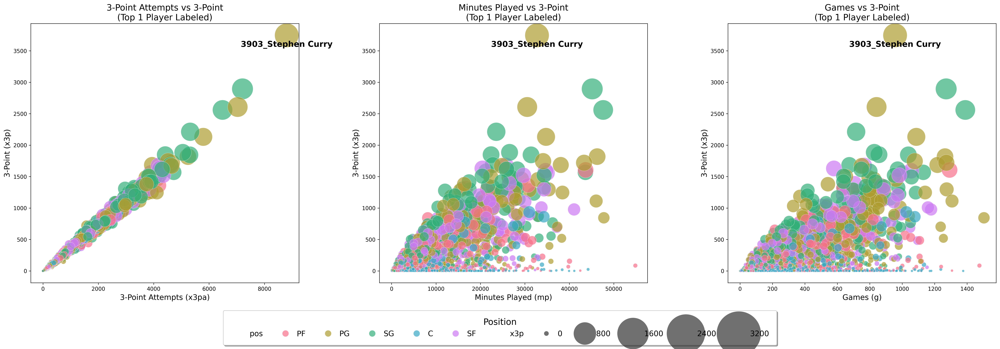

In [34]:
top_5_pos = df_id_player['pos'].value_counts().nlargest(5).index.tolist()
df_top5 = df_id_player[df_id_player['pos'].isin(top_5_pos)]

# Get the top 5 players by 3-point percentage (x3p)
top_1_players = df_top5.nlargest(1, 'x3p')

# Create a figure with three subplots and less space at the bottom for the legend
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(26, 9), dpi=300)

# First subplot: 3-Point Attempts vs 3-Point Percentage
sns.scatterplot(data=df_top5, x='x3pa', y='x3p',
                hue='pos', size='x3p',
                sizes=(20, 2000), alpha=0.7, legend='brief', ax=ax1)

# Add annotations for top 5 players
for idx, row in top_1_players.iterrows():
    ax1.annotate(row['id:Player'], (row['x3pa'], row['x3p']),
                 xytext=(0, -10), textcoords='offset points',
                 fontsize=15, fontweight='bold', alpha=1,
                 ha='center', va='top')

ax1.set_title('3-Point Attempts vs 3-Point\n(Top 1 Player Labeled)', fontsize=16)
ax1.set_xlabel('3-Point Attempts (x3pa)', fontsize=14)
ax1.set_ylabel('3-Point (x3p)', fontsize=14)

# Second subplot: Minutes Played vs 3-Point Percentage
sns.scatterplot(data=df_top5, x='mp', y='x3p',
                hue='pos', size='x3p',
                sizes=(20, 2000), alpha=0.7, legend='brief', ax=ax2)

# Add annotations for top 5 players
for idx, row in top_1_players.iterrows():
    ax2.annotate(row['id:Player'], (row['mp'], row['x3p']),
                 xytext=(0, -10), textcoords='offset points',
                 fontsize=15, fontweight='bold', alpha=1,
                 ha='center', va='top')

ax2.set_title('Minutes Played vs 3-Point\n(Top 1 Player Labeled)', fontsize=16)
ax2.set_xlabel('Minutes Played (mp)', fontsize=14)
ax2.set_ylabel('3-Point (x3p)', fontsize=14)

# Third subplot: Games vs 3-Point Percentage
sns.scatterplot(data=df_top5, x='g', y='x3p',
                hue='pos', size='x3p',
                sizes=(20, 2000), alpha=0.7, legend='brief', ax=ax3)

# Add annotations for top 5 players
for idx, row in top_1_players.iterrows():
    ax3.annotate(row['id:Player'], (row['g'], row['x3p']),
                 xytext=(0, -10), textcoords='offset points',
                 fontsize=15, fontweight='bold', alpha=1,
                 ha='center', va='top')

ax3.set_title('Games vs 3-Point\n(Top 1 Player Labeled)', fontsize=16)
ax3.set_xlabel('Games (g)', fontsize=14)
ax3.set_ylabel('3-Point (x3p)', fontsize=14)

# Adjust layout
plt.tight_layout()

# Move legend outside the plots with a single row
handles, labels = ax3.get_legend_handles_labels()
fig.legend(handles, labels, loc='center', bbox_to_anchor=(0.5, 0.05),
           ncol=len(handles), fontsize=14, markerscale=2, frameon=True,
           fancybox=True, shadow=True, borderpad=1, columnspacing=2,
           handletextpad=0.5, title='Position', title_fontsize=16)

# Remove individual legends from subplots
ax1.get_legend().remove()
ax2.get_legend().remove()
ax3.get_legend().remove()

# Adjust the subplot layout to make room for the legend
plt.subplots_adjust(bottom=0.18, wspace=0.3)

plt.show()

## Part 3: Case Study - Boston Celtics Winner in 2024 with 3 Points

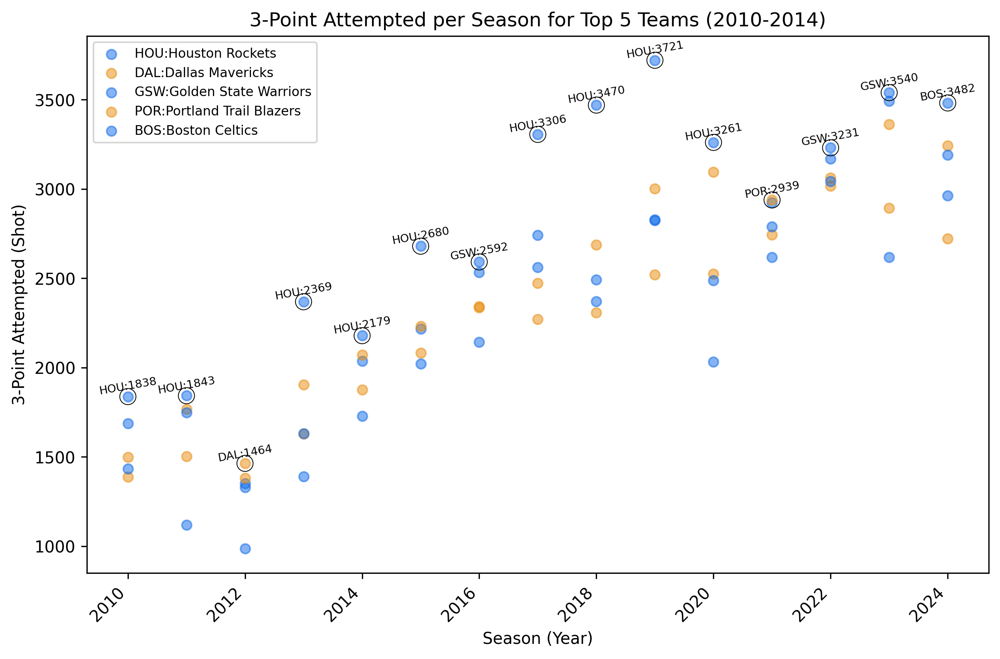

In [35]:
# Filter data for seasons since 2010
filtered_df = df_teamtotal[df_teamtotal['season'] >= 2010]

# Calculate the total x3pa for each team since 2010
team_total_x3pa = filtered_df.groupby('team')['x3pa'].sum().sort_values(ascending=False)

# Get the top 5 teams
top_5_teams = team_total_x3pa.head(5).index

# Filter the DataFrame for the top 5 teams
filtered_df = filtered_df[filtered_df['team'].isin(top_5_teams)]

# Find the highest x3pa for each season
highest_x3pa_each_season = filtered_df.loc[filtered_df.groupby('season')['x3pa'].idxmax()]

# Create a dictionary to map team names to abbreviations
team_abbreviations = dict(zip(df_teamtotal['team'], df_teamtotal['abbreviation']))

# Create the scatter plot
plt.figure(figsize=(10, 6), dpi=300)

# Create a dictionary to store legend handles and colors
legend_handles = {}

# Plot all points for top 5 teams with reduced opacity
for team in top_5_teams:
    team_data = filtered_df[filtered_df['team'] == team]
    abbreviation = team_abbreviations.get(team, team)  # Get the abbreviation for the team
    scatter = plt.scatter(team_data['season'], team_data['x3pa'], label=abbreviation, alpha=0.5)

    # Store the handle and color in the dictionary
    legend_handles[f"{abbreviation}:{team}"] = scatter


# Plot the highest x3pa points with border and x3pa:abbreviation
for index, row in highest_x3pa_each_season.iterrows():
    abbreviation = team_abbreviations.get(row['team'], row['team'])
    plt.scatter(row['season'], row['x3pa'], linewidths=0.5, s=100,
                edgecolors='black', facecolors='none')  # Highlight with black border
    text = f"{abbreviation}:{int(row['x3pa'])}"  # Format as x3pa:abbreviation
    plt.text(row['season'], row['x3pa'], text, ha='center', va='bottom', rotation=10,size=7)

# Add labels and title
plt.xlabel('Season (Year)')
plt.ylabel('3-Point Attempted (Shot)')
plt.title('3-Point Attempted per Season for Top 5 Teams (2010-2014)')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Create the legend with matching colors
legend_labels = list(legend_handles.keys())
handles = list(legend_handles.values())
plt.legend(handles, legend_labels, loc='best',fontsize=8)  # Use stored handles and labels

# Show the plot
plt.show()

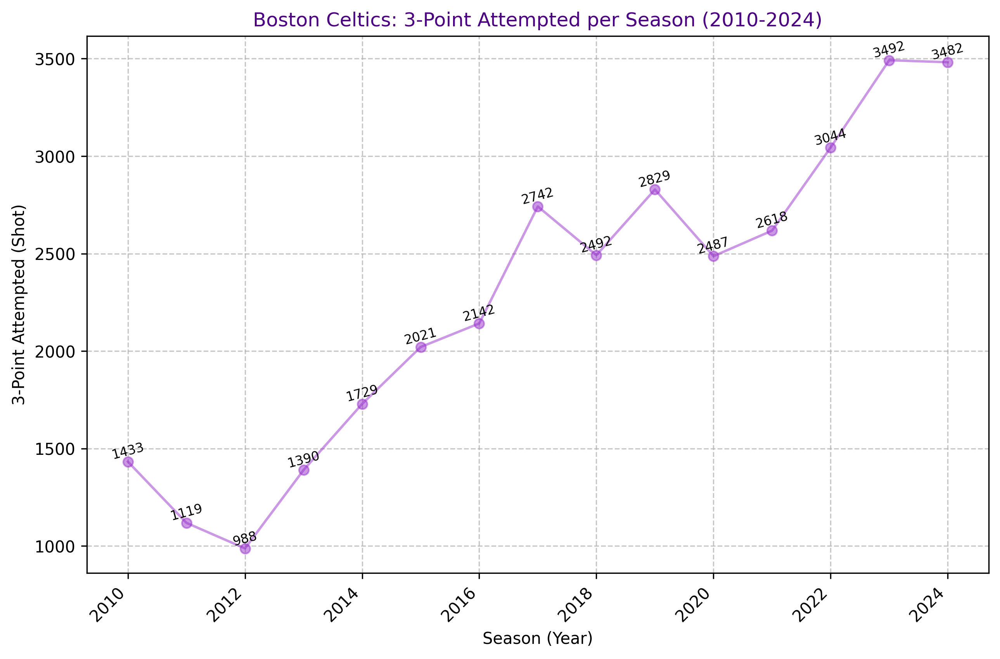

In [36]:
# Filter data for Boston Celtics and seasons between 2010 and 2024
boston_celtics_data = df_teamtotal[
    (df_teamtotal['team'] == 'Boston Celtics')
    & (df_teamtotal['season'] >= 2010)
    & (df_teamtotal['season'] <= 2024)
]

# Create the line chart
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(
    boston_celtics_data['season'],
    boston_celtics_data['x3pa'],
    marker='o',
    linestyle='-',
    color='darkorchid',
    alpha=0.5
)

# Add values on markers
for x, y in zip(boston_celtics_data['season'], boston_celtics_data['x3pa']):
    plt.text(x, y, str(int(y)), ha='center', va='bottom', fontsize=8, rotation=15)

# Customize the plot
plt.xlabel('Season (Year)')
plt.ylabel('3-Point Attempted (Shot)')
plt.title('Boston Celtics: 3-Point Attempted per Season (2010-2024)', color='indigo')
plt.xticks(rotation=45, ha='right')
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

<ipython-input-43-08e465042ab7>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  team_summaries_2024['Win rate'] = team_summaries_2024['w'] / 82


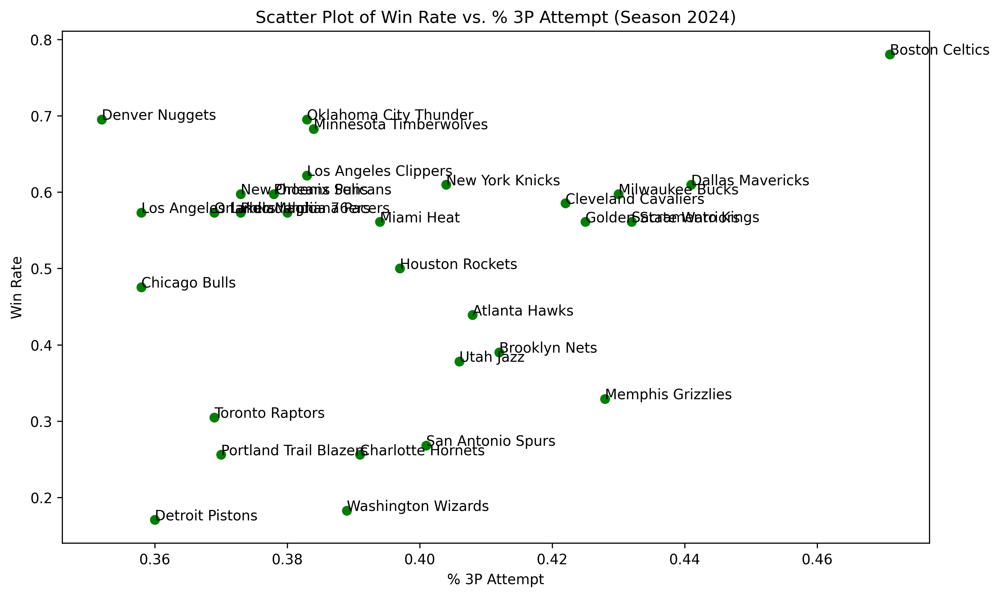

In [43]:
# Filter the data for the 2024 season
team_summaries_2024 = df_teamsummary[df_teamsummary['season'] == 2024] # Corrected the variable name from 'df_teamsummarys' to 'df_teamsummary'

# Calculate the "Win rate" from the 'w' column (win rate = w / 82)
team_summaries_2024['Win rate'] = team_summaries_2024['w'] / 82

# Create the scatter plot with Y-axis as "Win rate" and X-axis as "xp3_ar", with teams labeled
plt.figure(figsize=(10, 6),dpi = 300)
plt.scatter(team_summaries_2024['x3p_ar'], team_summaries_2024['Win rate'], color='green')

# Label each point with the team name
for i, team in enumerate(team_summaries_2024['team']):
    plt.text(team_summaries_2024['x3p_ar'].iloc[i], team_summaries_2024['Win rate'].iloc[i], team)

# Add labels and title
plt.xlabel('% 3P Attempt')
plt.ylabel('Win Rate')
plt.title('Scatter Plot of Win Rate vs. % 3P Attempt (Season 2024)')

# Display the scatter plot
plt.tight_layout()
plt.show()

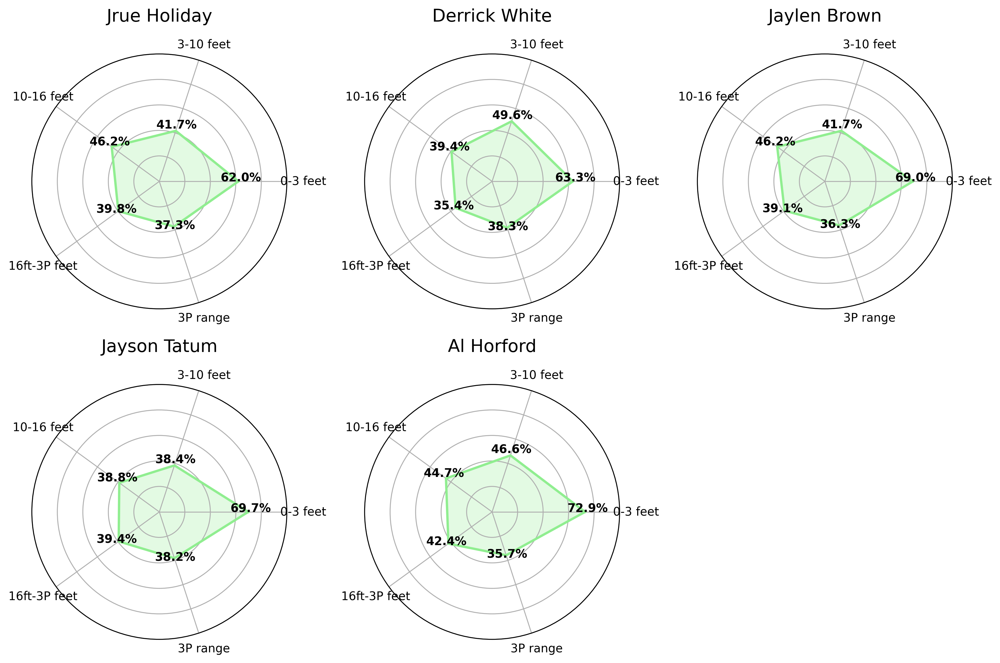

In [44]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from math import pi

# Define the shooting zones and corresponding display names
shooting_zones_columns = [
    'fg_percent_from_x0_3_range',
    'fg_percent_from_x3_10_range',
    'fg_percent_from_x10_16_range',
    'fg_percent_from_x16_3p_range',
    'fg_percent_from_x3p_range'
]

categories_display = [
    '0-3 feet',
    '3-10 feet',
    '10-16 feet',
    '16ft-3P feet',
    '3P range'
]

# Function to create radar charts with a 2x3 layout
def plot_radar_with_original_layout(player_ids, data):
    # Set dpi in plt.figure instead of figsize to affect resolution correctly
    fig, axes = plt.subplots(2, 3, figsize=(12, 8), subplot_kw=dict(polar=True), dpi=300)
    axes = axes.flatten()

    for i, player_id in enumerate(player_ids):
        # ตรวจสอบว่าคอลัมน์ 'player_id' มีอยู่ใน data
        if 'player_id' not in data.columns:
            print(f"Column 'player_id' does not exist in the data")
            return

        # เลือกข้อมูลผู้เล่นโดยใช้ player_id
        player_data = data[data['player_id'] == player_id]

        if player_data.empty:
            print(f"No data found for player_id: {player_id}")
            continue

        # ตรวจสอบว่าคอลัมน์เปอร์เซ็นต์การยิงทั้งหมดมีอยู่ใน DataFrame
        if not all(col in data.columns for col in shooting_zones_columns):
            print(f"Some of the required columns for shooting zones are missing in the data.")
            return

        player_name = player_data['player'].values[0]
        player_mean_values = player_data[shooting_zones_columns].mean().values * 100
        player_mean_values = np.concatenate((player_mean_values, [player_mean_values[0]]))

        categories = categories_display
        n = len(categories)
        angles = [i / float(n) * 2 * pi for i in range(n)]
        angles += angles[:1]

        ax = axes[i]
        ax.fill(angles, player_mean_values, color='lightgreen', alpha=0.25)
        ax.plot(angles, player_mean_values, color='lightgreen', linewidth=2, label=f'{player_name}')
        ax.set_title(player_name, size=15, y=1.1)
        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(categories, fontsize=10)

        # Set the radial limits to range from 0% to 100%
        ax.set_ylim(0, 100)

        # Remove radial tick labels (20, 40, 60, 80, 100)
        ax.set_yticklabels([])

        # Display values on the radar chart
        for j, angle in enumerate(angles[:-1]):
            ax.text(angle, player_mean_values[j] + 2, f'{player_mean_values[j]:.1f}%',
                    horizontalalignment='center', size=10, color='black', weight='bold')

    # Remove unused axes if there are less than 6 players
    if len(player_ids) < len(axes):
        for j in range(len(player_ids), len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Example usage with player IDs
player_ids = [int(3891), int(4492), int(4415), int(4518), int(3734)]  # Replace with your desired player IDs

# ตรวจสอบให้แน่ใจว่า DataFrame df_playershoot ถูกต้องตามที่ต้องการ
plot_radar_with_original_layout(player_ids, df_playershoot)


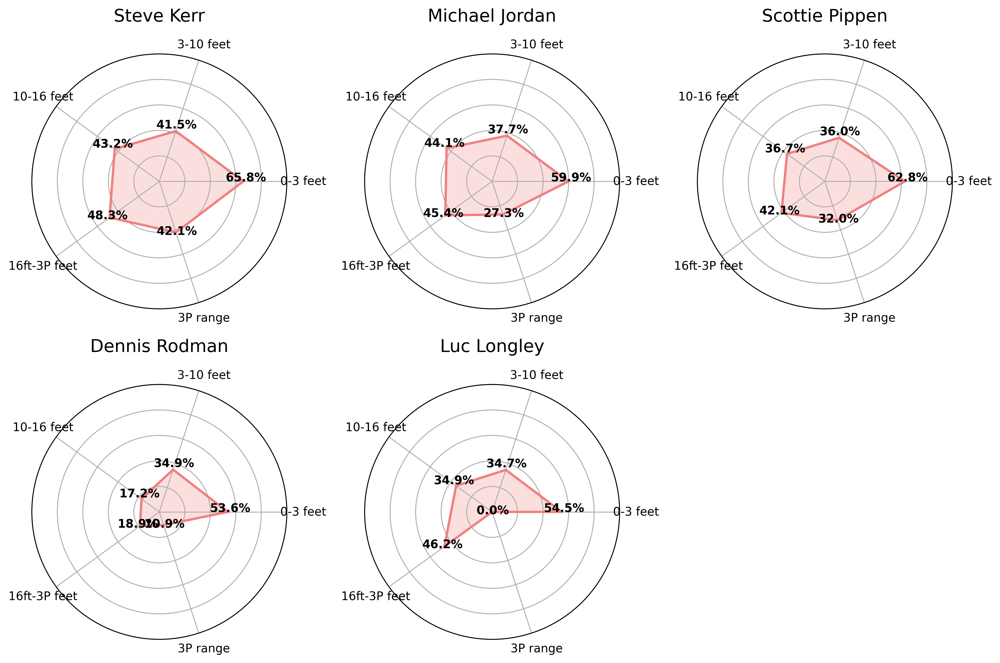

In [45]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from math import pi

# Define the shooting zones and corresponding display names
shooting_zones_columns = [
    'fg_percent_from_x0_3_range',
    'fg_percent_from_x3_10_range',
    'fg_percent_from_x10_16_range',
    'fg_percent_from_x16_3p_range',
    'fg_percent_from_x3p_range'
]

categories_display = [
    '0-3 feet',
    '3-10 feet',
    '10-16 feet',
    '16ft-3P feet',
    '3P range'
]

# Function to create radar charts with a 2x3 layout
def plot_radar_with_original_layout(player_ids, data):
    # Set dpi in plt.figure instead of figsize to affect resolution correctly
    fig, axes = plt.subplots(2, 3, figsize=(12, 8), subplot_kw=dict(polar=True), dpi=300)
    axes = axes.flatten()

    for i, player_id in enumerate(player_ids):
        # ตรวจสอบว่าคอลัมน์ 'player_id' มีอยู่ใน data
        if 'player_id' not in data.columns:
            print(f"Column 'player_id' does not exist in the data")
            return

        # เลือกข้อมูลผู้เล่นโดยใช้ player_id
        player_data = data[data['player_id'] == player_id]

        if player_data.empty:
            print(f"No data found for player_id: {player_id}")
            continue

        # ตรวจสอบว่าคอลัมน์เปอร์เซ็นต์การยิงทั้งหมดมีอยู่ใน DataFrame
        if not all(col in data.columns for col in shooting_zones_columns):
            print(f"Some of the required columns for shooting zones are missing in the data.")
            return

        player_name = player_data['player'].values[0]
        player_mean_values = player_data[shooting_zones_columns].mean().values * 100
        player_mean_values = np.concatenate((player_mean_values, [player_mean_values[0]]))

        categories = categories_display
        n = len(categories)
        angles = [i / float(n) * 2 * pi for i in range(n)]
        angles += angles[:1]

        ax = axes[i]
        ax.fill(angles, player_mean_values, color='lightcoral', alpha=0.25)
        ax.plot(angles, player_mean_values, color='lightcoral', linewidth=2, label=f'{player_name}')
        ax.set_title(player_name, size=15, y=1.1)
        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(categories, fontsize=10)

        # Set the radial limits to range from 0% to 100%
        ax.set_ylim(0, 100)

        # Remove radial tick labels (20, 40, 60, 80, 100)
        ax.set_yticklabels([])

        # Display values on the radar chart
        for j, angle in enumerate(angles[:-1]):
            ax.text(angle, player_mean_values[j] + 2, f'{player_mean_values[j]:.1f}%',
                    horizontalalignment='center', size=10, color='black', weight='bold')

    # Remove unused axes if there are less than 6 players
    if len(player_ids) < len(axes):
        for j in range(len(player_ids), len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Example usage with player IDs
player_ids = [int(2467), int(2193), int(2394), int(2301), int(2669)]  # Replace with your desired player IDs

# ตรวจสอบให้แน่ใจว่า DataFrame df_playershoot ถูกต้องตามที่ต้องการ
plot_radar_with_original_layout(player_ids, df_playershoot)
